In [ ]:
import scipy.cluster.hierarchy as hca
import pandas as pd
import numpy as np
from pylab import *
from matplotlib import pyplot
%matplotlib inline
np.set_printoptions(suppress=True)
from sklearn import cluster
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn import metrics
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import calinski_harabasz_score

C:\Users\tadnan\AppData\Local\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

# Data Preparation

In [ ]:
# Load the CSV file
data = pd.read_csv('Socio-hpms.csv')
data.head(10)

C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\1735369441.py:2: DtypeWarning: Columns (24,73,74,75) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('Socio-hpms.csv')


,Unnamed: 0.1,Unnamed: 0,AADT_mean,AADT_Single_Unit_mean,Year,AADT_Combination_mean,Dir_Factor_mean,Future_AADT_mean,IRI_mean,Rutting_mean,Cracking_Percent_mean,Thickness_Rigid_mean,Thickness_Flexible_mean,Base_Thickness_mean,Lane_Width_mean,Last_Overlay_Thickness_mean,F_System_mode,Urban_Code_mode,Through_Lanes_mode,Surface_Type_mode,Base_Type_mode,County_Code_mode,State_Code_mode,Year_Last_Improv_mode,Year_Last_Construction_mode,RHU_AV,RHU_AV_MN,RHU_AV_MX,ALBEDO_AVG,CLD_CVR_AV,EMISSIVITY,EMIS_AVG,PER_SUN_AV,SW_SF_AVG,SW_SF_STDV,SW_SURFACE,SW_TOA,DAYS_A_32C,DAYS_BL_0C,FRZ_IDX,FRZ_THAW,SOIL_TL1AV,SOIL_TL2AV,TEMP_AVG,TEMP_MAX,TEMP_MIN,AVG_WND_VEL_AV,AVG_WND_VEL_MX,PRECIPITATION,EVAPORATION,hzdepb_r_mean,sieveno4_r_mean,sieveno10_r_mean,sieveno40_r_mean,sieveno200_r_mean,sandtotal_r_mean,sandfine_r_mean,silttotal_r_mean,claytotal_r_mean,ll_r_mean,pi_r_mean,FIPS_CODE,GEO_ID,FIPS_Code,County,Total Population,Male,Female,Median Age,Median Ages for Men,Median Ages for Women,Percentage_Male,Percentage_Female,Population 16 years and over,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Total Households,Mean income Household (dollars),Total Population_RACE,White Alone,Black or African American alone,Asian alone,Some other race alone,White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage)
0,0,0,1395.0,156.0,2017,54.0,59.0,1590.0,82.0,0.000000,0.0,9.030256,6.000000,15.0,12.0,2.000000,5,99999.0,2,6,2,73,55,1998.0,1993.0,78.5,29.2,119.2,0.2,0.5,8639.6,1.0,46.4,127617.4,63117.0,1531408.2,2691043.0,1.9,170.5,1081.5,80.3,6.7,6.5,5.6,31.5,-31.1,3.0,11.3,1089.7,773.3,57.400000,88.900000,85.300000,70.500000,49.100000,54.800000,18.300000,34.300000,10.900000,23.000000,4.900000,55073,0500000US55073,55073,"Marathon County, Wisconsin",135732.0,68099.0,67633.0,40.5,39.5,41.6,50.171662,49.828338,108237.0,66.0,0.9,55084.0,77209.0,135732.0,122343.0,1433.0,8034.0,1575.0,90.135709,1.055757,5.919017,1.160375
1,1,1,88.0,34.0,2017,34.0,58.9,89.0,177.0,0.000000,0.0,9.030256,6.000000,15.0,12.0,2.000000,4,93025.0,2,2,2,73,55,2012.0,2012.0,78.5,29.2,119.2,0.2,0.5,8639.6,1.0,46.4,127617.4,63117.0,1531408.2,2691043.0,1.9,170.5,1081.5,80.3,6.7,6.5,5.6,31.5,-31.1,3.0,11.3,1089.7,773.3,57.400000,88.900000,85.300000,70.500000,49.100000,54.800000,18.300000,34.300000,10.900000,23.000000,4.900000,55073,0500000US55073,55073,"Marathon County, Wisconsin",135732.0,68099.0,67633.0,40.5,39.5,41.6,50.171662,49.828338,108237.0,66.0,0.9,55084.0,77209.0,135732.0,122343.0,1433.0,8034.0,1575.0,90.135709,1.055757,5.919017,1.160375
2,2,2,415.0,165.0,2017,165.0,59.0,420.0,46.0,0.000000,0.0,9.030256,6.000000,15.0,11.0,2.000000,5,99999.0,2,2,2,73,55,2004.0,2004.0,78.5,29.2,119.2,0.2,0.5,8639.6,1.0,46.4,127617.4,63117.0,1531408.2,2691043.0,1.9,170.5,1081.5,80.3,6.7,6.5,5.6,31.5,-31.1,3.0,11.3,1089.7,773.3,57.400000,88.900000,85.300000,70.500000,49.100000,54.800000,18.300000,34.300000,10.900000,23.000000,4.900000,55073,0500000US55073,55073,"Marathon County, Wisconsin",135732.0,68099.0,67633.0,40.5,39.5,41.6,50.171662,49.828338,108237.0,66.0,0.9,55084.0,77209.0,135732.0,122343.0,1433.0,8034.0,1575.0,90.135709,1.055757,5.919017,1.160375
3,3,3,18721.0,2067.0,2017,711.0,59.0,18758.0,107.0,0.000000,0.0,8.000000,6.000000,15.0,12.0,2.000000,5,99999.0,2,7,2,73,55,1998.0,1998.0,78.5,29.2,119.2,0.2,0.5,8639.6,1.0,46.4,127617.4,63117.0,1531408.2,2691043.0,1.9,170.5,1081.5,80.3,6.7,6.5,5.6,31.5,-31.1,3.0,11.3,1089.7,773.3,57.400000,88.900000,85.300000,70.500000,49.100000,54.800000,18.300000,34.300000,10.900000,23.000000,4.900000,55073,0500000US55073,55073,"Marathon County, Wisconsin",135732.0,68099.0,67633.0,40.5,39.5,41.6,50.171662,49.828338,108237.0,66.0,0.9,55084.0,77209.0,135732.0,122343.0,1433.0,8034.0,1575.0,90.135709,1.055757,5.919017,1.160375
4,4,4,4541.0,390.0,2017,123.0,59.0,6560.0,138.0,0.100000,2.0,8.000000,4.400000,15.0,12.0,2.000000,4,45910.0,2,7,2,63,55,1989.0,2001.0

In [ ]:
data.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'AADT_mean', 'AADT_Single_Unit_mean',
       'Year', 'AADT_Combination_mean', 'Dir_Factor_mean', 'Future_AADT_mean',
       'IRI_mean', 'Rutting_mean', 'Cracking_Percent_mean',
       'Thickness_Rigid_mean', 'Thickness_Flexible_mean',
       'Base_Thickness_mean', 'Lane_Width_mean', 'Last_Overlay_Thickness_mean',
       'F_System_mode', 'Urban_Code_mode', 'Through_Lanes_mode',
       'Surface_Type_mode', 'Base_Type_mode', 'County_Code_mode',
       'State_Code_mode', 'Year_Last_Improv_mode',
       'Year_Last_Construction_mode', 'RHU_AV', 'RHU_AV_MN', 'RHU_AV_MX',
       'ALBEDO_AVG', 'CLD_CVR_AV', 'EMISSIVITY', 'EMIS_AVG', 'PER_SUN_AV',
       'SW_SF_AVG', 'SW_SF_STDV', 'SW_SURFACE', 'SW_TOA', 'DAYS_A_32C',
       'DAYS_BL_0C', 'FRZ_IDX', 'FRZ_THAW', 'SOIL_TL1AV', 'SOIL_TL2AV',
       'TEMP_AVG', 'TEMP_MAX', 'TEMP_MIN', 'AVG_WND_VEL_AV', 'AVG_WND_VEL_MX',
       'PRECIPITATION', 'EVAPORATION', 'hzdepb_r_mean', 'sieveno4_r_mean',
       'sieveno10_r

Here,
1. Urban Code Mode
2. AADT mean
3. IRI Mean  
4. RHU_AV
5. Precipitation
6. Mean Household income  
7. Median Age
8. Employment Rate on Population 16 years and over
9. Unemployment Rate on Population 16 years and over
10. White Alone
11. Black or African American alone
12. Asian alone
13. Some other race alone

In [ ]:
data.shape

(73280, 87)

In [ ]:
## dropping redunanant columns
data.drop(['Unnamed: 0', 'AADT_Single_Unit_mean', 'F_System_mode',
       'AADT_Combination_mean', 'Dir_Factor_mean', 'Future_AADT_mean', 'Rutting_mean',
       'Cracking_Percent_mean', 'Thickness_Rigid_mean', 'Thickness_Flexible_mean',
       'Base_Thickness_mean', 'Lane_Width_mean', 'Last_Overlay_Thickness_mean',
        'Through_Lanes_mode',
       'Surface_Type_mode', 'Base_Type_mode', 'County_Code_mode',
       'State_Code_mode', 'Year_Last_Improv_mode',
       'Year_Last_Construction_mode', 'RHU_AV_MN', 'RHU_AV_MX',
       'ALBEDO_AVG', 'CLD_CVR_AV', 'EMISSIVITY', 'EMIS_AVG', 'PER_SUN_AV',
       'SW_SF_AVG', 'SW_SF_STDV', 'SW_SURFACE', 'SW_TOA', 'DAYS_A_32C',
       'DAYS_BL_0C', 'FRZ_IDX', 'FRZ_THAW', 'SOIL_TL1AV', 'SOIL_TL2AV',
       'TEMP_AVG', 'TEMP_MAX', 'TEMP_MIN', 'AVG_WND_VEL_AV', 'AVG_WND_VEL_MX',
        'EVAPORATION', 'hzdepb_r_mean', 'sieveno4_r_mean',
       'sieveno10_r_mean', 'sieveno40_r_mean', 'sieveno200_r_mean',
       'sandtotal_r_mean', 'sandfine_r_mean', 'silttotal_r_mean',
       'claytotal_r_mean', 'll_r_mean', 'pi_r_mean'], axis=1, inplace=True)

In [ ]:
# notice there are null
data.isnull().any()

Unnamed: 0.1                                         False
AADT_mean                                            False
Year                                                 False
IRI_mean                                             False
Urban_Code_mode                                      False
RHU_AV                                               False
PRECIPITATION                                        False
FIPS_CODE                                            False
GEO_ID                                               False
FIPS_Code                                            False
County                                               False
Total Population                                     False
Male                                                 False
Female                                               False
Median Age                                           False
Median Ages for Men                                  False
Median Ages for Women                                Fal

In [ ]:
data.dtypes

Unnamed: 0.1                                           int64
AADT_mean                                            float64
Year                                                   int64
IRI_mean                                             float64
Urban_Code_mode                                      float64
RHU_AV                                               float64
PRECIPITATION                                        float64
FIPS_CODE                                              int64
GEO_ID                                                object
FIPS_Code                                              int64
County                                                object
Total Population                                     float64
Male                                                 float64
Female                                               float64
Median Age                                           float64
Median Ages for Men                                  float64
Median Ages for Women   

In [ ]:
## convert two objects to numeric
cols_to_convert = ['Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over']
data[cols_to_convert] = data[cols_to_convert].apply(lambda col: pd.to_numeric(col, errors='coerce'))

In [ ]:
data.isnull().any()

Unnamed: 0.1                                         False
AADT_mean                                            False
Year                                                 False
IRI_mean                                             False
Urban_Code_mode                                      False
RHU_AV                                               False
PRECIPITATION                                        False
FIPS_CODE                                            False
GEO_ID                                               False
FIPS_Code                                            False
County                                               False
Total Population                                     False
Male                                                 False
Female                                               False
Median Age                                           False
Median Ages for Men                                  False
Median Ages for Women                                Fal

In [ ]:
cols_to_fill_mean = ['Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over']

## calculate the mean
means = data[cols_to_fill_mean].mean(numeric_only=True)
mean

<function numpy.mean(a, axis=None, dtype=None, out=None, keepdims=<no value>, *, where=<no value>)>

In [ ]:
## Fill with Nan with means
data.fillna(means, inplace=True)

In [ ]:
data.dtypes

Unnamed: 0.1                                           int64
AADT_mean                                            float64
Year                                                   int64
IRI_mean                                             float64
Urban_Code_mode                                      float64
RHU_AV                                               float64
PRECIPITATION                                        float64
FIPS_CODE                                              int64
GEO_ID                                                object
FIPS_Code                                              int64
County                                                object
Total Population                                     float64
Male                                                 float64
Female                                               float64
Median Age                                           float64
Median Ages for Men                                  float64
Median Ages for Women   

In [ ]:
## dropping redunanant columns
data.drop(['Unnamed: 0.1'], axis=1, inplace=True)

In [ ]:
data.columns

Index(['AADT_mean', 'Year', 'IRI_mean', 'Urban_Code_mode', 'RHU_AV',
       'PRECIPITATION', 'FIPS_CODE', 'GEO_ID', 'FIPS_Code', 'County',
       'Total Population', 'Male', 'Female', 'Median Age',
       'Median Ages for Men', 'Median Ages for Women', 'Percentage_Male',
       'Percentage_Female', 'Population 16 years and over',
       'Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over', 'Total Households',
       'Mean income Household (dollars)', 'Total Population_RACE',
       'White Alone', 'Black or African American alone', 'Asian alone',
       'Some other race alone', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage) ',
       'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)'],
      dtype='object')

In [ ]:
data.rename(columns = {'RHU_AV': 'Relative Humidity', 'IRI_mean':'IRI', 'AADT_mean':'AADT',
    'Employment Rate on Population 16 years and over': 'Employment Rate on Population 16 Years and Over',
    'Unemployment Rate on Population 16 years and over': 'Unemployment Rate on Population 16 Years and Over',
                      'PRECIPITATION': 'Precipitation'}, inplace=True)

In [ ]:
data.columns

Index(['AADT', 'Year', 'IRI', 'Urban_Code_mode', 'Relative Humidity',
       'Precipitation', 'FIPS_CODE', 'GEO_ID', 'FIPS_Code', 'County',
       'Total Population', 'Male', 'Female', 'Median Age',
       'Median Ages for Men', 'Median Ages for Women', 'Percentage_Male',
       'Percentage_Female', 'Population 16 years and over',
       'Employment Rate on Population 16 Years and Over',
       'Unemployment Rate on Population 16 Years and Over', 'Total Households',
       'Mean income Household (dollars)', 'Total Population_RACE',
       'White Alone', 'Black or African American alone', 'Asian alone',
       'Some other race alone', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage) ',
       'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)'],
      dtype='object')

## Check correlations between   features

Firslty we will check linear correlations then we will check non-linear correlations like square root and log relationsips. Based on the relations we could drop the columns

In [ ]:
def calculate_corr(df, exclude_columns=None):
    # Set plot font preferences
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'Times New Roman'
    plt.rcParams['font.weight'] = 'bold'
    plt.rcParams['font.size'] = 30  # Adjusted font size for better readability

    # Select only numeric data from the DataFrame
    numeric_data = df.select_dtypes(include='number')

    # Exclude specified columns if any
    if exclude_columns is not None:
        numeric_data = numeric_data.drop(columns=exclude_columns, errors='ignore')

    # Compute the correlation matrix
    data_corr = numeric_data.corr(method='pearson')

    # Create a mask to display only the lower triangle
    mask = np.triu(np.ones_like(data_corr, dtype=bool))

    # Adjusting figure size based on the number of numeric features to ensure boxes are large enough
    plt.figure(figsize=(max(8, len(numeric_data.columns) * 2), max(6, len(numeric_data.columns) * 1.5)))

    # Plotting the heatmap with annotations and making sure the annot font size is adjusted properly
    sns.heatmap(data_corr, annot=True, linewidth=.5, cmap="RdYlGn", center=0, mask=mask, annot_kws={"size": 30})

    # Adjust layout to make more space if necessary
    plt.subplots_adjust(left=0.2, bottom=0.2)  # Adjust bottom margin if left margin adjustment is insufficient

    # Save the figure before showing it
    plt.savefig('Correlation_among_numeric_features.jpg')

    # Show the plot
    plt.show()

    return data_corr


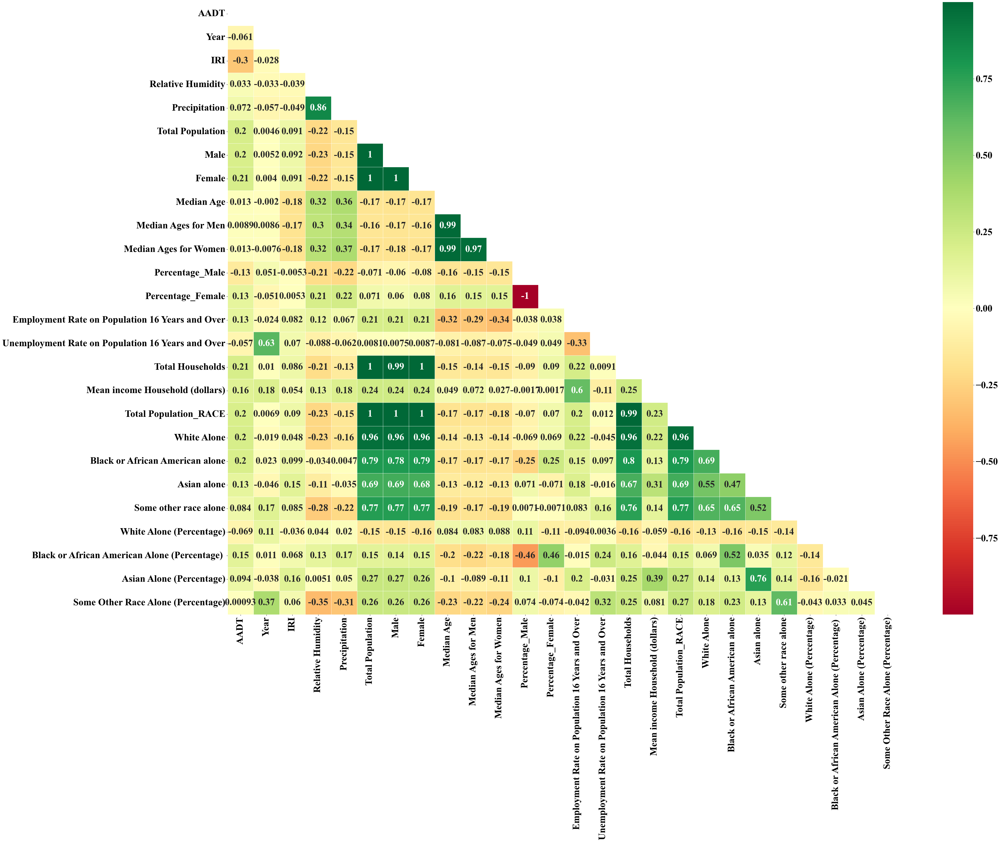

In [ ]:
# Assuming 'data' is your DataFrame
data_corr = calculate_corr(data, exclude_columns=['Urban_Code_mode', 'F_System_mode', 'FIPS_CODE', 'FIPS_Code'])

In [ ]:
data.shape

(73280, 32)

In [ ]:
## dropping social columns

# Correcting the syntax error by removing the extraneous comma
data.drop(['FIPS_CODE','FIPS_Code', 'GEO_ID', 'County', 'Male', 'Female', 'Percentage_Male', 'Percentage_Female', 'Population 16 years and over', 'Total Population_RACE', 'Total Households',
           'White Alone', 'Asian alone', 'Black or African American alone', 'Median Ages for Men', 'Median Ages for Women', 'Some other race alone'],
          axis=1, inplace=True)

In [ ]:
data.shape

(73280, 15)

In [ ]:
data.columns

Index(['AADT', 'Year', 'IRI', 'Urban_Code_mode', 'Relative Humidity',
       'Precipitation', 'Total Population', 'Median Age',
       'Employment Rate on Population 16 Years and Over',
       'Unemployment Rate on Population 16 Years and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage) ',
       'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)'],
      dtype='object')

## Now check check linear and nonlinear correlations also

C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\4287148474.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_annotations = correlations_df.applymap(lambda x: f'{x:.2f}')


<Figure size 1000x1000 with 0 Axes>

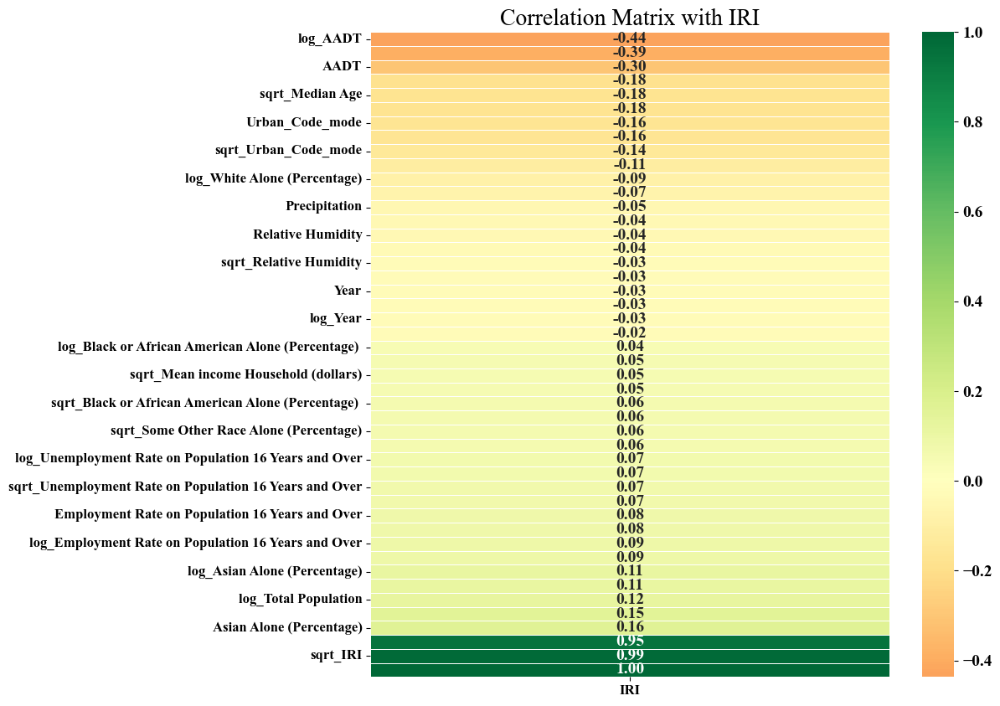

In [ ]:
# Select the numeric columns
numeric_subset = data.select_dtypes(include='number')

# Create columns with square root and log of numeric columns
for col in numeric_subset.columns:
    # Add a small constant to avoid taking log of zero
    numeric_subset['sqrt_' + col] = np.sqrt(numeric_subset[col])
    numeric_subset['log_' + col] = np.log(numeric_subset[col] + 1e-9)

# Select the categorical columns
categorical_subset = data[['Urban_Code_mode']]

# One hot encode
categorical_subset = pd.get_dummies(categorical_subset)

# Join the two dataframes using concat
# Make sure to use axis = 1 to perform a column bind
features = pd.concat([numeric_subset, categorical_subset], axis=1)

# Drop rows without an energy IRI_mean
features = features.dropna(subset=['IRI'])

# Find correlations with the IRI_mean
correlations = features.corr()['IRI'].dropna().sort_values()

# Convert correlations to DataFrame for seaborn heatmap compatibility
correlations_df = correlations.to_frame()  # Convert Series to DataFrame

# Prepare annotations: convert each correlation value to a string formatted to two decimal places
formatted_annotations = correlations_df.applymap(lambda x: f'{x:.2f}')

## Set fonts
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 14

# Plot the heatmap
plt.figure(figsize=(10, 10))

# Plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(correlations_df, annot=formatted_annotations.values, fmt="", linewidths=.5, cmap="RdYlGn", center=0,
            annot_kws={"size": 14})

plt.title('Correlation Matrix with IRI', fontsize=20)  # Adjust title font size here
plt.xticks(fontsize=12)  # Adjust x-axis label font size here
plt.yticks(fontsize=12)  # Adjust y-axis label font size here
plt.savefig("Linear and non-linear correlations with IRI in data.jpg")
plt.show()

In [ ]:
# Display most negative correlations
correlations.head(15)

log_AADT                        -0.436790
sqrt_AADT                       -0.391469
AADT                            -0.302647
Median Age                      -0.178890
sqrt_Median Age                 -0.177459
log_Median Age                  -0.175306
Urban_Code_mode                 -0.162885
Urban_Code_mode                 -0.162885
sqrt_Urban_Code_mode            -0.143026
log_Urban_Code_mode             -0.106756
log_White Alone (Percentage)    -0.087699
sqrt_White Alone (Percentage)   -0.072459
Precipitation                   -0.049163
sqrt_Precipitation              -0.043130
Relative Humidity               -0.039075
Name: IRI, dtype: float64

In [ ]:
# Display most positive correlations
correlations.tail(15)

Black or African American Alone (Percentage)              0.067907
sqrt_Unemployment Rate on Population 16 Years and Over    0.070041
Unemployment Rate on Population 16 Years and Over         0.070122
Employment Rate on Population 16 Years and Over           0.082096
sqrt_Employment Rate on Population 16 Years and Over      0.083861
log_Employment Rate on Population 16 Years and Over       0.085487
Total Population                                          0.091481
log_Asian Alone (Percentage)                              0.114206
sqrt_Total Population                                     0.114982
log_Total Population                                      0.123755
sqrt_Asian Alone (Percentage)                             0.153968
Asian Alone (Percentage)                                  0.161230
log_IRI                                                   0.948586
sqrt_IRI                                                  0.986718
IRI                                                       1.00

## Convert the urban codes to rual 0, small urban 1, urban 2

In [ ]:
data['Urban_Code_mode'].unique()

array([99999.        , 93025.        , 45910.        , 47719.        ,
       40429.        ,  4384.        , 99998.        , 78580.        ,
       20287.        , 18748.        , 22042.        , 10972.        ,
       36892.        , 52390.        , 47854.        , 27253.        ,
       34300.        , 77149.        , 23824.        , 39430.        ,
        5869.        , 56980.        , 42157.        , 71155.        ,
       58357.        ,  7138.        , 83116.        ,  2602.        ,
       29872.        ,  6760.        , 26038.        , 53200.        ,
       30223.        , 92674.        ,   970.        , 71803.        ,
       75664.        , 45262.        , 79633.        , 11350.        ,
       63217.        ,  7732.        ,  3358.        , 11728.        ,
       38647.        , 25228.        , 96670.        , 35164.        ,
       38809.        , 15670.        , 73261.        , 95833.        ,
       19558.        , 32653.        , 75988.        , 33814.        ,
      

In [ ]:
# Define the function to transform values to categories
def label_category(code):
    if code == 99999:
        return 'rural'
    elif code == 99998:
        return 'small urban'
    else:
        return 'urban'

# Apply the transformation to the "state_code_mode" column
data['Urban_Code_mode'] = data['Urban_Code_mode'].apply(label_category)

# Display the updated DataFrame to check if the transformation is applied as expected
data.head(10)

,AADT,Year,IRI,Urban_Code_mode,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage)
0,1395.0,2017,82.0,rural,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
1,88.0,2017,177.0,urban,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
2,415.0,2017,46.0,rural,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
3,18721.0,2017,107.0,rural,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
4,4541.0,2017,138.0,urban,75.9,986.4,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537
5,40768.0,2017,99.0,urban,75.9,986.4,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537
6,40961.0,2017,64.0,urban,76.2,1068.6,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359
7,25756.0,2017,114.7,urban,76.2,1068.6,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359
8,7826.0,2017,96.0,rural,76.8,1006.0,71063.0,28.1,53.8,1.8,59829.0,88.225940,2.316255,1.778703,0.451712
9,2807.0,2017,180.9,urban,77.0,1196.0,4652980.0,33.6,62.6,0.3,86830.0,63.818198,18.918328,7.083375,7.310197


In [ ]:
# Filter rows where 'Urban_Code_mode' is 'rural'
rural_rows = data[data['Urban_Code_mode'] == 'rural']

# Display the filtered DataFrame
rural_rows.count()

AADT                                                 15997
Year                                                 15997
IRI                                                  15997
Urban_Code_mode                                      15997
Relative Humidity                                    15997
Precipitation                                        15997
Total Population                                     15997
Median Age                                           15997
Employment Rate on Population 16 Years and Over      15997
Unemployment Rate on Population 16 Years and Over    15997
Mean income Household (dollars)                      15997
White Alone (Percentage)                             15997
Black or African American Alone (Percentage)         15997
Asian Alone (Percentage)                             15997
Some Other Race Alone (Percentage)                   15997
dtype: int64

## urban_code_mode

You can use label encoding for converting the categoricals to numeric
reference: https://www.analyticsvidhya.com/blog/2023/07/label-encoding-in-python/?fbclid=IwAR3M75qn-5xxJvo4g9HHWBx6BBHCfqXrVmH6G_wtPL4Kt6cvdADc6GLp8YA

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Create a label encoder object
le = LabelEncoder()

## Assign numerical values and sorting in another column

data['Urban_Code_mode_encoded'] = le.fit_transform(data['Urban_Code_mode'])

# First, let's list all current columns to understand their order
current_columns = data.columns.tolist()

# Define the desired position for 'Urban_Code_mode_encoded' - right after 'Urban_Code_mode'
# Find the index of 'Urban_Code_mode' and add 1 to get the desired position for 'Urban_Code_mode_encoded'
urban_code_mode_index = current_columns.index('Urban_Code_mode') + 1

# Now, let's remove 'Urban_Code_mode_encoded' from its current position and insert it at the desired position
current_columns.remove('Urban_Code_mode_encoded')  # Remove the encoded column from its current position
current_columns.insert(urban_code_mode_index, 'Urban_Code_mode_encoded')  # Insert it right after 'Urban_Code_mode'

# Reorder the DataFrame columns based on the updated list
data = data[current_columns]

# Display the DataFrame to verify the new column order
data.head(10)


# Display the updated DataFrame to check if the transformation is applied as expected
data.head(10)

,AADT,Year,IRI,Urban_Code_mode,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage)
0,1395.0,2017,82.0,rural,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
1,88.0,2017,177.0,urban,2,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
2,415.0,2017,46.0,rural,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
3,18721.0,2017,107.0,rural,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
4,4541.0,2017,138.0,urban,2,75.9,986.4,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537
5,40768.0,2017,99.0,urban,2,75.9,986.4,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537
6,40961.0,2017,64.0,urban,2,76.2,1068.6,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359
7,25756.0,2017,114.7,urban,2,76.2,1068.6,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359
8,7826.0,2017,96.0,rural,0,76.8,1006.0,71063.0,28.1,53.8,1.8,59829.0,88.225940,2.316255,1.778703,0.451712
9,2807.0,2017,180.9,urban,2,77.0,1196.0,4652980.0,33.6,62.6,0.3,86830.0,63.818198,18.918328,7.083375,7.310197


In [ ]:
data.head(10)

,AADT,Year,IRI,Urban_Code_mode,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage)
0,1395.0,2017,82.0,rural,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
1,88.0,2017,177.0,urban,2,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
2,415.0,2017,46.0,rural,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
3,18721.0,2017,107.0,rural,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
4,4541.0,2017,138.0,urban,2,75.9,986.4,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537
5,40768.0,2017,99.0,urban,2,75.9,986.4,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537
6,40961.0,2017,64.0,urban,2,76.2,1068.6,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359
7,25756.0,2017,114.7,urban,2,76.2,1068.6,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359
8,7826.0,2017,96.0,rural,0,76.8,1006.0,71063.0,28.1,53.8,1.8,59829.0,88.225940,2.316255,1.778703,0.451712
9,2807.0,2017,180.9,urban,2,77.0,1196.0,4652980.0,33.6,62.6,0.3,86830.0,63.818198,18.918328,7.083375,7.310197


In [ ]:
# Filter rows where 'Urban_Code_mode' is 'rural'
small_urban_rows = data[data['Urban_Code_mode_encoded'] == 1]

# Display the filtered DataFrame
small_urban_rows.head(10)

,AADT,Year,IRI,Urban_Code_mode,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage)
54,42811.0,2017,45.0,small urban,1,67.1,933.1,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725
157,15440.0,2017,71.4,small urban,1,74.7,840.2,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691
162,10315.0,2017,78.0,small urban,1,74.7,840.2,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691
482,30589.0,2017,190.0,small urban,1,76.5,1130.2,109027.0,41.6,59.1,1.6,78385.0,86.387776,7.468792,2.415915,0.680565
483,37030.0,2017,146.8,small urban,1,76.5,1130.2,109027.0,41.6,59.1,1.6,78385.0,86.387776,7.468792,2.415915,0.680565
485,6633.0,2017,186.5,small urban,1,78.6,1097.5,75353.0,42.0,59.6,1.7,67165.0,86.073547,3.031067,0.719281,4.915531
486,21647.0,2017,58.0,small urban,1,78.6,1097.5,75353.0,42.0,59.6,1.7,67165.0,86.073547,3.031067,0.719281,4.915531
487,24924.0,2017,61.8,small urban,1,78.6,1097.5,75353.0,42.0,59.6,1.7,67165.0,86.073547,3.031067,0.719281,4.915531
524,21752.0,2017,80.0,small urban,1,76.4,995.6,88174.0,44.1,55.1,1.7,70533.0,95.439699,1.397237,0.252909,0.793885
527,34876.0,2017,75.5,small urban,1,76.4,995.6,88174.0,44.1,55.1,1.7,70533.0,95.439699,1.397237,0.252909,0.793885


In [ ]:
small_urban_rows.count()

AADT                                                 6408
Year                                                 6408
IRI                                                  6408
Urban_Code_mode                                      6408
Urban_Code_mode_encoded                              6408
Relative Humidity                                    6408
Precipitation                                        6408
Total Population                                     6408
Median Age                                           6408
Employment Rate on Population 16 Years and Over      6408
Unemployment Rate on Population 16 Years and Over    6408
Mean income Household (dollars)                      6408
White Alone (Percentage)                             6408
Black or African American Alone (Percentage)         6408
Asian Alone (Percentage)                             6408
Some Other Race Alone (Percentage)                   6408
dtype: int64

In [ ]:
# Filter rows where 'Urban_Code_mode' is 'rural'
rurual_rows = data[data['Urban_Code_mode_encoded'] == 0]

# Display the filtered DataFrame
rurual_rows.head(10)

,AADT,Year,IRI,Urban_Code_mode,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage)
0,1395.0,2017,82.0,rural,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
2,415.0,2017,46.0,rural,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
3,18721.0,2017,107.0,rural,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
8,7826.0,2017,96.0,rural,0,76.8,1006.0,71063.0,28.1,53.8,1.8,59829.0,88.225940,2.316255,1.778703,0.451712
35,33346.0,2017,60.9,rural,0,67.1,933.1,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725
36,33346.0,2017,81.5,rural,0,67.1,933.1,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725
37,50198.0,2017,58.0,rural,0,67.1,933.1,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725
55,36907.0,2017,47.0,rural,0,67.1,933.1,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725
144,9518.0,2017,59.0,rural,0,74.7,840.2,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691
163,22435.0,2017,86.5,rural,0,74.7,840.2,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691


In [ ]:
rurual_rows.count()

AADT                                                 15997
Year                                                 15997
IRI                                                  15997
Urban_Code_mode                                      15997
Urban_Code_mode_encoded                              15997
Relative Humidity                                    15997
Precipitation                                        15997
Total Population                                     15997
Median Age                                           15997
Employment Rate on Population 16 Years and Over      15997
Unemployment Rate on Population 16 Years and Over    15997
Mean income Household (dollars)                      15997
White Alone (Percentage)                             15997
Black or African American Alone (Percentage)         15997
Asian Alone (Percentage)                             15997
Some Other Race Alone (Percentage)                   15997
dtype: int64

In [ ]:
data.columns

Index(['AADT', 'Year', 'IRI', 'Urban_Code_mode', 'Urban_Code_mode_encoded',
       'Relative Humidity', 'Precipitation', 'Total Population', 'Median Age',
       'Employment Rate on Population 16 Years and Over',
       'Unemployment Rate on Population 16 Years and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage) ',
       'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)'],
      dtype='object')

In [ ]:
data.drop(['Urban_Code_mode'], axis=1, inplace=True)

In [ ]:
data.head(10)

,AADT,Year,IRI,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage)
0,1395.0,2017,82.0,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
1,88.0,2017,177.0,2,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
2,415.0,2017,46.0,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
3,18721.0,2017,107.0,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375
4,4541.0,2017,138.0,2,75.9,986.4,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537
5,40768.0,2017,99.0,2,75.9,986.4,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537
6,40961.0,2017,64.0,2,76.2,1068.6,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359
7,25756.0,2017,114.7,2,76.2,1068.6,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359
8,7826.0,2017,96.0,0,76.8,1006.0,71063.0,28.1,53.8,1.8,59829.0,88.225940,2.316255,1.778703,0.451712
9,2807.0,2017,180.9,2,77.0,1196.0,4652980.0,33.6,62.6,0.3,86830.0,63.818198,18.918328,7.083375,7.310197


In [ ]:
data.columns

Index(['AADT', 'Year', 'IRI', 'Urban_Code_mode_encoded', 'Relative Humidity',
       'Precipitation', 'Total Population', 'Median Age',
       'Employment Rate on Population 16 Years and Over',
       'Unemployment Rate on Population 16 Years and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage) ',
       'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)'],
      dtype='object')

In [ ]:
data.dtypes

AADT                                                 float64
Year                                                   int64
IRI                                                  float64
Urban_Code_mode_encoded                                int32
Relative Humidity                                    float64
Precipitation                                        float64
Total Population                                     float64
Median Age                                           float64
Employment Rate on Population 16 Years and Over      float64
Unemployment Rate on Population 16 Years and Over    float64
Mean income Household (dollars)                      float64
White Alone (Percentage)                             float64
Black or African American Alone (Percentage)         float64
Asian Alone (Percentage)                             float64
Some Other Race Alone (Percentage)                   float64
dtype: object

In [ ]:
data.shape

(73280, 15)

In [ ]:
data.isnull().any()

AADT                                                 False
Year                                                 False
IRI                                                  False
Urban_Code_mode_encoded                              False
Relative Humidity                                    False
Precipitation                                        False
Total Population                                     False
Median Age                                           False
Employment Rate on Population 16 Years and Over      False
Unemployment Rate on Population 16 Years and Over    False
Mean income Household (dollars)                      False
White Alone (Percentage)                             False
Black or African American Alone (Percentage)         False
Asian Alone (Percentage)                             False
Some Other Race Alone (Percentage)                   False
dtype: bool

## Filter dataset year by Year

We need to sort by years, instead we need IRI values of

In [ ]:
df_2017 = data[data['Year'] == 2017]
df_2018 = data[data['Year'] == 2018]
df_2019 = data[data['Year'] == 2019]
df_2020 = data[data['Year'] == 2020]

print(df_2017.shape)
print(df_2018.shape)
print(df_2019.shape)
print(df_2020.shape)

(16554, 15)
(9956, 15)
(23247, 15)
(23523, 15)


### Step 2: Pre-clustering using K-Means

Understand KMeans Clustering from here:
https://github.com/alexandrehsd/Cluster-Analysis/blob/master/Cluster%20Analysis.ipynb

See this vidoe for better understanding: https://www.youtube.com/watch?v=4b5d3muPQmA

 The K-means algorithm performs the following steps:

1. Choose the number (K) of clusters
2. Specify the cluster seeds (Define the initial position of the centroids)
Here, you can create a range of cluster numbers and use loop to find the best answers.
3. Assign each point to a centroid based on its proximity (if the centroid
 is the nearest centroid to the point, then assign to , do this for all points)
4. Adjust the centroid (recalculate the position of each centroid based in the points assigned to them)
5. Repeat step 3 and 4, until achieving a stop criterion
6. After achieve a stop criteria, end execution.

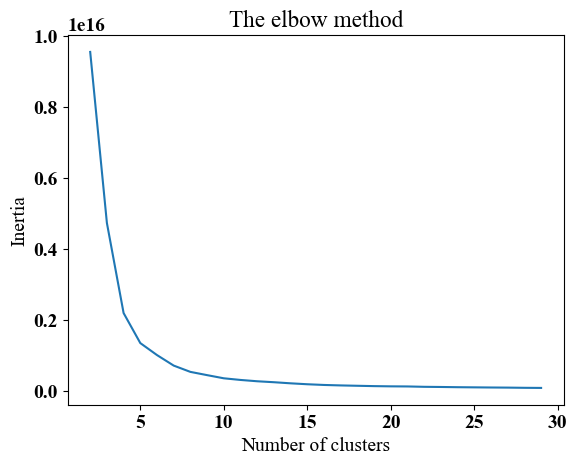

In [ ]:
# Finding the optimal number of clusters for K-Means using Elbow Method
# source: https://medium.com/mlearning-ai/elbow-method-vs-silhouette-co-efficient-in-determining-the-number-of-clusters-33baff2fbeee

# step-1: initialize some number of clusters

inertia = []

for n_clusters in range(2, 30):
  kmeans_model = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)
  kmeans_model.fit(data)
  inertia.append(kmeans_model.inertia_)

# Plotting the elbow curve
plt.plot(range(2, 30), inertia)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

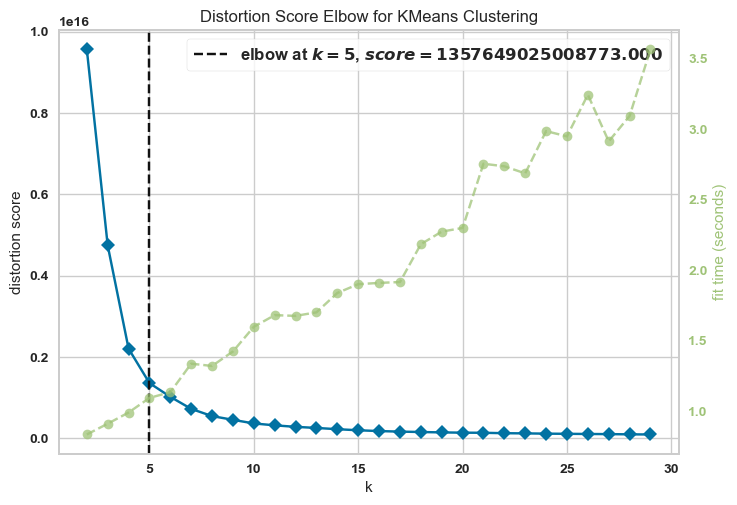

In [ ]:
## source: https://towardsdatascience.com/cheat-sheet-to-implementing-7-methods-for-selecting-optimal-number-of-clusters-in-python-898241e1d6ad

# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(data)        # Fit data to visualizer
visualizer.show(outpath="elbow_visualization.png")

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

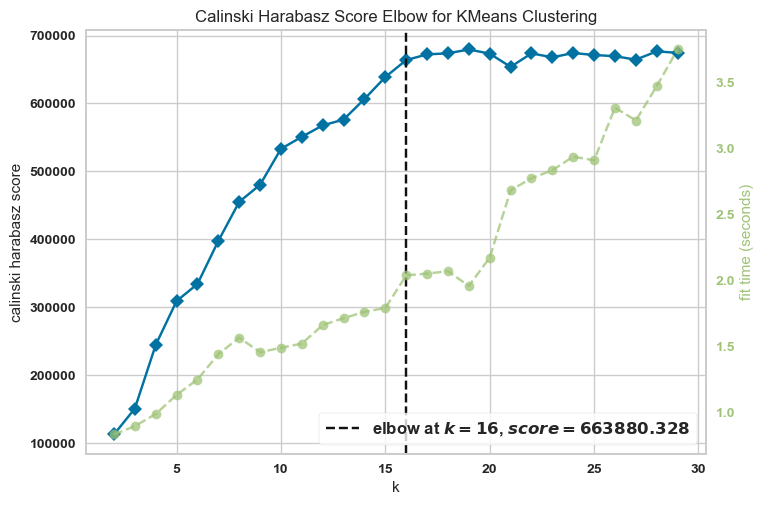

In [ ]:
##  check optimal clusters for calinski_harabasz
## source: https://towardsdatascience.com/cheat-sheet-to-implementing-7-methods-for-selecting-optimal-number-of-clusters-in-python-898241e1d6ad

from yellowbrick.cluster import KElbowVisualizer
model = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)

# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), metric='calinski_harabasz', timings= True)
visualizer.fit(data)        # Fit the data to the visualizer
visualizer.show(outpath="calinski_harabasz_visualization.png")

### Calculate the Silhoutte Score

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Initialize a list to store the average silhouette scores
silhouette_scores = []

# Iterate over the range of desired cluster numbers
for n_clusters in range(5, 17):   # Iterate over the range of desired cluster numbers from 5 to 16

    # Create a KMeans instance with n_clusters
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)

    # Fit the model and predict cluster labels
    cluster_labels = kmeans.fit_predict(data)

    # Calculate the silhouette score
    silhouette_avg = silhouette_score(data, cluster_labels)
    silhouette_avg = f"{silhouette_avg:.2f}"  # This will format the score to have two decimal places

    # Print and store the average silhouette score
    print(f"The average silhouette score for {n_clusters} clusters: {silhouette_avg}")
    silhouette_scores.append(silhouette_avg)

# Find the number of clusters with the highest silhouette score
best_index = silhouette_scores.index(max(silhouette_scores))
best_n_clusters = range(5, 17)[best_index]
print(f"Best number of clusters within range 6-17: {best_n_clusters} with a silhouette score of {silhouette_scores[best_index]}")


The average silhouette score for 5 clusters: 0.62
The average silhouette score for 6 clusters: 0.60
The average silhouette score for 7 clusters: 0.60
The average silhouette score for 8 clusters: 0.57
The average silhouette score for 9 clusters: 0.51
The average silhouette score for 10 clusters: 0.51
The average silhouette score for 11 clusters: 0.48
The average silhouette score for 12 clusters: 0.49
The average silhouette score for 13 clusters: 0.49
The average silhouette score for 14 clusters: 0.47
The average silhouette score for 15 clusters: 0.46
The average silhouette score for 16 clusters: 0.45
Best number of clusters within range 6-17: 5 with a silhouette score of 0.62


### Calculate the boudlin score

In [ ]:
from sklearn.metrics import davies_bouldin_score

# Initialize a list to store the Davies-Bouldin scores
davies_bouldin_scores = []

# Assuming 'data' is your dataset
# Iterate over the range of desired cluster numbers
for n_clusters in range(5, 17):  # # Iterate over the range of desired cluster numbers from 5 to 16

    # Create a KMeans instance with n_clusters
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)

    # Fit the model and predict the cluster labels
    cluster_labels = kmeans.fit_predict(data)

    # Calculate the Davies-Bouldin score
    score = davies_bouldin_score(data, cluster_labels)
    score = f"{score:.2f}"  # This will format the score to have two decimal places

    # Print and store the Davies-Bouldin score
    print(f"The Davies-Bouldin score for {n_clusters} clusters: {score}")
    davies_bouldin_scores.append(score)

# Find the number of clusters with the lowest Davies-Bouldin score
best_index = davies_bouldin_scores.index(min(davies_bouldin_scores))
best_n_clusters = range(5, 17)[best_index]
print(f"Best number of clusters within range 6-16: {best_n_clusters} with a Davies-Bouldin score of {davies_bouldin_scores[best_index]}")


The Davies-Bouldin score for 5 clusters: 0.43
The Davies-Bouldin score for 6 clusters: 0.45
The Davies-Bouldin score for 7 clusters: 0.39
The Davies-Bouldin score for 8 clusters: 0.42
The Davies-Bouldin score for 9 clusters: 0.46
The Davies-Bouldin score for 10 clusters: 0.49
The Davies-Bouldin score for 11 clusters: 0.54
The Davies-Bouldin score for 12 clusters: 0.51
The Davies-Bouldin score for 13 clusters: 0.51
The Davies-Bouldin score for 14 clusters: 0.54
The Davies-Bouldin score for 15 clusters: 0.54
The Davies-Bouldin score for 16 clusters: 0.58
Best number of clusters within range 6-16: 7 with a Davies-Bouldin score of 0.39


### guide source: https://www.kaggle.com/code/dhanyajothimani/basic-visualization-and-clustering-in-python


In [ ]:
# Applying K-Means with the optimal number of clusters
kmeans = KMeans(n_clusters=10, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)

cluster_labels = kmeans.fit_predict(data)

In [ ]:
cluster_labels

array([8, 8, 8, ..., 8, 8, 8])

In [ ]:
kmeans.n_features_in_

15

In [ ]:
kmeans.feature_names_in_

array(['AADT', 'Year', 'IRI', 'Urban_Code_mode_encoded',
       'Relative Humidity', 'Precipitation', 'Total Population',
       'Median Age', 'Employment Rate on Population 16 Years and Over',
       'Unemployment Rate on Population 16 Years and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage) ',
       'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)'],
      dtype=object)

In [ ]:
kmeans.get_params

<bound method BaseEstimator.get_params of KMeans(n_clusters=10, n_init=10, random_state=42)>

In [ ]:
kmeans_data_cluster = pd.DataFrame(cluster_labels)
kmeans_data_cluster.head(100)

,0
0,8
1,8
2,8
3,8
4,8
5,8
6,8
7,8
8,8
9,3


In [ ]:
data.insert((data.shape[1]),'kmeans_data_cluster',kmeans_data_cluster)

In [ ]:
data['kmeans_data_cluster'].count()

73280

In [ ]:
data.head(100)

,AADT,Year,IRI,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster
0,1395.0,2017,82.0,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375,8
1,88.0,2017,177.0,2,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375,8
2,415.0,2017,46.0,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375,8
3,18721.0,2017,107.0,0,78.5,1089.7,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375,8
4,4541.0,2017,138.0,2,75.9,986.4,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537,8
5,40768.0,2017,99.0,2,75.9,986.4,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537,8
6,40961.0,2017,64.0,2,76.2,1068.6,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359,8
7,25756.0,2017,114.7,2,76.2,1068.6,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359,8
8,7826.0,2017,96.0,0,76.8,1006.0,71063.0,28.1,53.8,1.8,59829.0,88.225940,2.316255,1.778703,0.451712,8
9,2807.0,2017,180.9,2,77.0,1196.0,4652980.0,33.6,62.6,0.3,86830.0,63.818198,18.918328,7.083375,7.310197,3


In [ ]:
data.columns.get_loc("Unemployment Rate on Population 16 Years and Over")

9

In [ ]:
## check correlation in cluster profiles

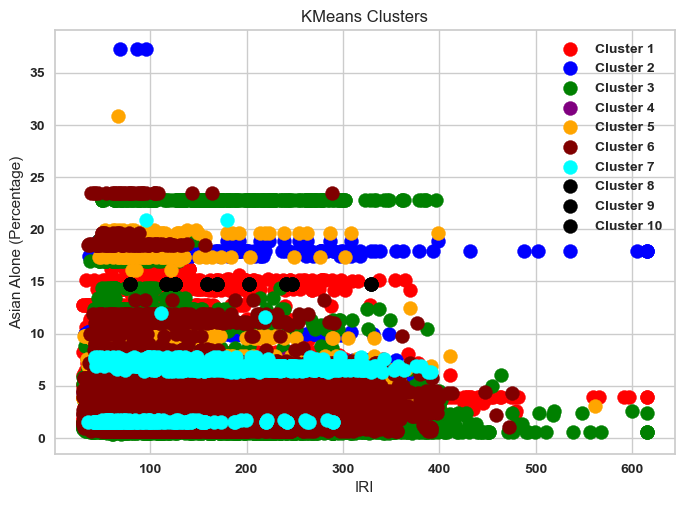

In [ ]:
# Let's find the column names for positions 3 and 14
x_axis_name = data.columns[2]  # Corrected to match Python's zero-indexing
y_axis_name = data.columns[13]  # Corrected to match the 14th column, considering zero-indexing

X = data.iloc[:, [2, 13]].values  # Adjusted to correctly reference the 3rd and 14th columns

# Plotting the clusters
plt.scatter(X[cluster_labels == 0, 0], X[cluster_labels == 0, 1], s=100, c='red', label='Cluster 1')
plt.scatter(X[cluster_labels == 1, 0], X[cluster_labels == 1, 1], s=100, c='blue', label='Cluster 2')
plt.scatter(X[cluster_labels == 2, 0], X[cluster_labels == 2, 1], s=100, c='green', label='Cluster 3')
plt.scatter(X[cluster_labels == 3, 0], X[cluster_labels == 3, 1], s=100, c='purple', label='Cluster 4')
plt.scatter(X[cluster_labels == 4, 0], X[cluster_labels == 4, 1], s=100, c='orange', label='Cluster 5')
plt.scatter(X[cluster_labels == 5, 0], X[cluster_labels == 5, 1], s=100, c='maroon', label='Cluster 6')
plt.scatter(X[cluster_labels == 6, 0], X[cluster_labels == 6, 1], s=100, c='cyan', label='Cluster 7')
plt.scatter(X[cluster_labels == 7, 0], X[cluster_labels == 7, 1], s=100, c='black', label='Cluster 8')
plt.scatter(X[cluster_labels == 7, 0], X[cluster_labels == 7, 1], s=100, c='black', label='Cluster 9')
plt.scatter(X[cluster_labels == 7, 0], X[cluster_labels == 7, 1], s=100, c='black', label='Cluster 10')

plt.title('KMeans Clusters')
plt.legend()

# Set the labels to the actual column names
plt.xlabel(x_axis_name)
plt.ylabel(y_axis_name)
plt.savefig('k-means_clusters.png')
plt.show()


# All parameters by IRI_mean in all clusters

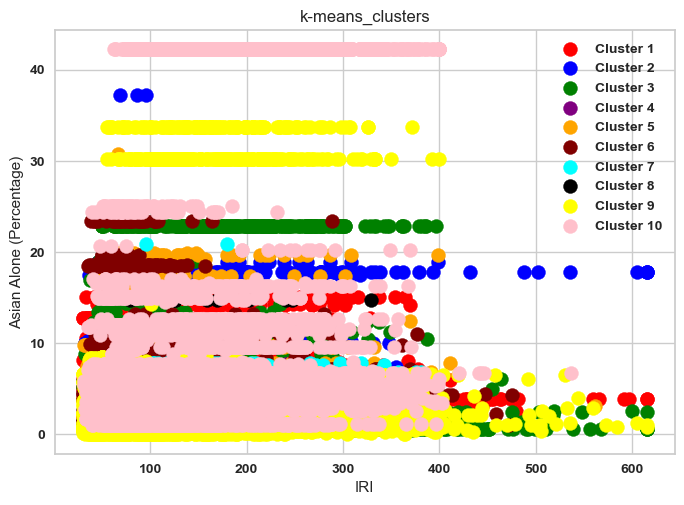

In [ ]:
# Plotting the clusters

plt.scatter(X[cluster_labels == 0, 0], X[cluster_labels == 0, 1], s=100, c='red', label='Cluster 1')
plt.scatter(X[cluster_labels == 1, 0], X[cluster_labels == 1, 1], s=100, c='blue', label='Cluster 2')
plt.scatter(X[cluster_labels == 2, 0], X[cluster_labels == 2, 1], s=100, c='green', label='Cluster 3')
plt.scatter(X[cluster_labels == 3, 0], X[cluster_labels == 3, 1], s=100, c='purple', label='Cluster 4')
plt.scatter(X[cluster_labels == 4, 0], X[cluster_labels == 4, 1], s=100, c='orange', label='Cluster 5')
plt.scatter(X[cluster_labels == 5, 0], X[cluster_labels == 5, 1], s=100, c='maroon', label='Cluster 6')
plt.scatter(X[cluster_labels == 6, 0], X[cluster_labels == 6, 1], s=100, c='cyan', label='Cluster 7')
plt.scatter(X[cluster_labels == 7, 0], X[cluster_labels == 7, 1], s=100, c='black', label='Cluster 8')

# Adjustments for clusters 9 and 10 with different colors and labels
plt.scatter(X[cluster_labels == 8, 0], X[cluster_labels == 8, 1], s=100, c='yellow', label='Cluster 9')
plt.scatter(X[cluster_labels == 9, 0], X[cluster_labels == 9, 1], s=100, c='pink', label='Cluster 10')

plt.title('k-means_clusters')
plt.legend()

# Set the labels to the actual column names
plt.xlabel(x_axis_name)
plt.ylabel(y_axis_name)
plt.savefig('k-means_clusters.png')
plt.show()

### Scale the data for present the social features after k-means clustering

In [ ]:
df = data.sort_values(by='IRI', ascending=True)
df.head(10)

,AADT,Year,IRI,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster
71903,39626.0,2020,30.0,2,38.500000,257.192923,184128.0,37.0,56.0,6.0,78117.0,67.876151,2.334789,1.495699,41.038843,2
54426,31205.0,2020,30.0,2,49.500000,395.017077,524149.0,34.0,65.0,7.0,96716.5,27.871846,9.225049,8.212550,11.362036,0
38993,60885.0,2019,30.0,2,77.200000,1358.600000,421164.0,39.9,62.3,4.7,84720.0,80.366081,6.299921,1.560912,9.243193,5
31564,44700.0,2019,30.0,0,31.900000,149.800000,4485414.0,36.9,61.6,4.4,92992.0,79.081998,5.933187,4.287252,4.769972,3
62751,35634.0,2020,30.0,2,76.333333,1280.222923,1227068.0,41.0,62.0,5.0,94397.0,12.087024,12.354083,3.957401,1.895168,4
63237,38502.0,2020,30.0,0,77.583333,1362.717462,191063.0,44.0,60.0,4.0,97697.5,126.256784,1.168201,1.148312,1.176052,2
10053,15078.0,2017,30.0,0,78.100000,1382.000000,111750.0,45.0,52.9,2.1,62785.0,90.881432,6.208501,0.655928,0.544966,8
57227,4080.0,2020,30.0,0,84.083333,1231.349077,94580.0,47.0,57.0,5.0,70499.5,151.253965,1.229647,0.477902,0.658702,8
38982,40712.0,2019,30.0,2,75.900000,1231.600000,163929.0,45.3,58.6,4.3,75836.0,90.196365,6.149614,0.662482,0.157995,8
31845,16681.0,2019,30.0,0,33.000000,229.000000,235099.0,54.7,46.3,4.4,71282.0,88.911480,0.859213,1.081672,5.151447,2


In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Step 2: Define the list of columns to remove from the dataframe.
cols_to_remove = ['Year', 'IRI', 'Urban_Code_mode_encoded', 'kmeans_data_cluster']

# Step 3: Get the locations of the columns to remove in the dataframe.
cols_indices_to_remove = [df.columns.get_loc(col) for col in cols_to_remove]

# Step 4: Remove the specified columns from the dataframe.
removed_cols_data = df[cols_to_remove]
addi_data = df.drop(columns=cols_to_remove)

# Step 5: Separate columns you want to scale.
cols_to_scale = addi_data.columns

# Step 6: Scale only the selected columns using MinMaxScaler.
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(addi_data)

# Step 7: Convert scaled_data_array to DataFrame.
scaled_data= pd.DataFrame(scaled_data, columns=cols_to_scale)

# Step 8: Reinsert the removed columns back into the dataframe.
for col, idx in zip(cols_to_remove, cols_indices_to_remove):
    scaled_data.insert(loc=idx, column=col, value=removed_cols_data[col])

In [ ]:
scaled_data = scaled_data.sort_values(by='IRI', ascending=True)
scaled_data.head(10)

,AADT,Year,IRI,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster
71903,0.002944,2020,30.0,2,0.748264,0.349907,0.021766,0.312217,0.748219,0.253425,0.372498,0.037595,0.260403,0.059572,0.024671,2
54426,0.030268,2020,30.0,2,0.883970,0.415509,0.016559,0.389140,0.641330,0.260274,0.366269,0.043919,0.032535,0.045337,0.025972,0
38993,0.015276,2019,30.0,2,0.817708,0.340828,0.012598,0.800905,0.085511,0.253425,0.236177,0.045657,0.072989,0.031629,0.035324,5
31564,0.020724,2019,30.0,0,0.762153,0.316968,0.007915,0.359729,0.574822,0.349315,0.203061,0.039717,0.143751,0.051444,0.075368,3
62751,0.025528,2020,30.0,2,0.947917,0.784569,0.074928,0.294118,0.738717,0.198630,0.462631,0.037976,0.043496,0.273453,0.048919,4
63237,0.023885,2020,30.0,0,0.338542,0.098587,0.010339,0.140271,0.741093,0.157534,0.310279,0.039997,0.082268,0.028352,0.183322,2
10053,0.030402,2017,30.0,0,0.834780,0.423008,0.015247,0.389140,0.570071,0.328767,0.202859,0.023247,0.088355,0.022055,0.145905,8
57227,0.021866,2020,30.0,0,0.791377,0.372793,0.011575,0.343891,0.641330,0.191781,0.362446,0.088880,0.052400,0.057842,0.019789,8
38982,0.015276,2019,30.0,2,0.817419,0.340835,0.012893,0.796380,0.095012,0.328767,0.242134,0.036142,0.073125,0.031276,0.084822,8
31845,0.018225,2019,30.0,0,0.751736,0.366720,0.004427,0.282805,0.434679,0.164384,0.112719,0.023559,0.648774,0.030631,0.019370,2


In [ ]:
scaled_data.describe()

,AADT,Year,IRI,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster
count,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000
mean,0.060464,2018.733338,117.524537,1.475955,0.731248,0.337204,0.037333,0.328627,0.594368,0.261599,0.310420,0.044340,0.137171,0.091911,0.087549,5.132178
std,0.080127,1.135507,70.511227,0.828270,0.192818,0.124730,0.057188,0.104382,0.133549,0.141881,0.142492,0.050133,0.147477,0.129785,0.106101,3.086643
min,0.000000,2017.000000,30.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.012180,2018.000000,65.000000,1.000000,0.731170,0.299695,0.007333,0.266968,0.520190,0.157534,0.210258,0.031346,0.034884,0.030989,0.020135,2.000000
50%,0.033776,2019.000000,97.300000,2.000000,0.798611,0.371247,0.017948,0.323529,0.610451,0.260274,0.284816,0.040214,0.088355,0.055438,0.048011,5.000000
75%,0.074258,2020.000000,151.000000,2.000000,0.826389,0.414395,0.044458,0.389140,0.681710,0.342466,0.384180,0.046060,0.183413,0.106750,0.117378,8.000000
max,1.000000,2020.000000,615.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,9.000000


In [ ]:
scaled_data.columns

Index(['AADT', 'Year', 'IRI', 'Urban_Code_mode_encoded', 'Relative Humidity',
       'Precipitation', 'Total Population', 'Median Age',
       'Employment Rate on Population 16 Years and Over',
       'Unemployment Rate on Population 16 Years and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage) ',
       'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)',
       'kmeans_data_cluster'],
      dtype='object')

## Check all variables after k-means

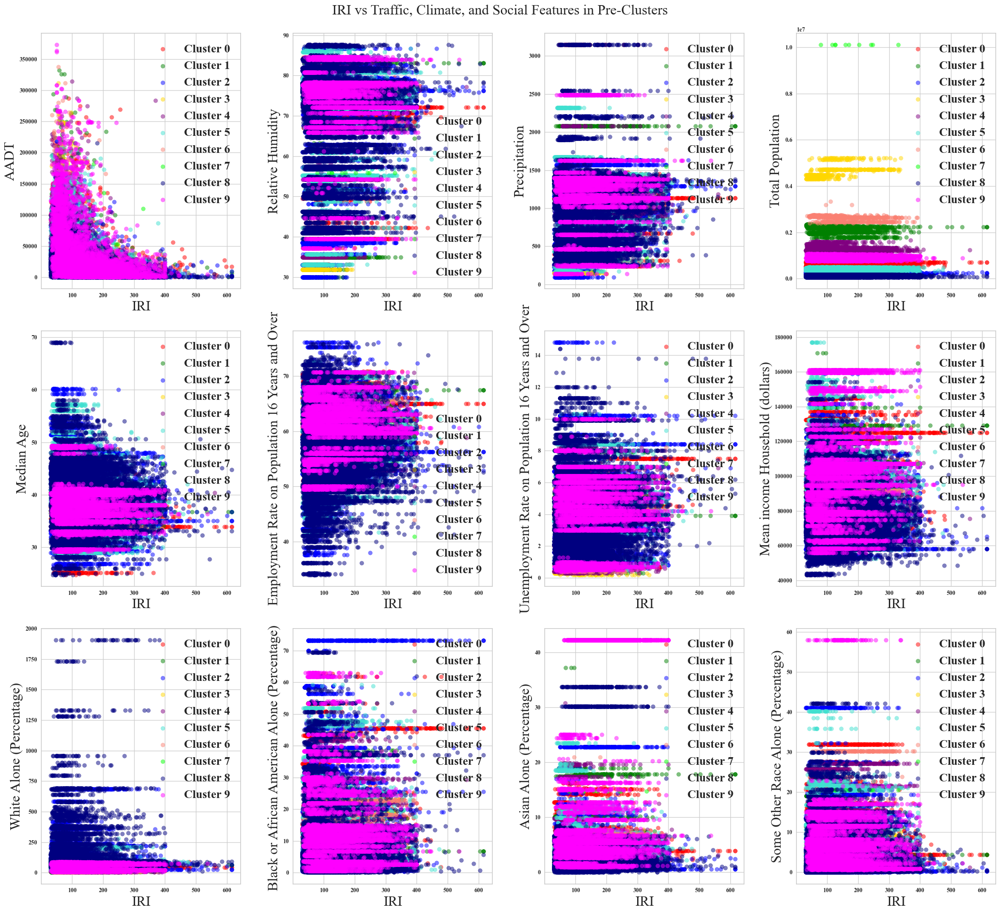

In [ ]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = [col for col in data.columns if col not in exclude_columns and data[col].dtype in ['float64', 'int64']]

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Consider increasing this if the plots become too crowded
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, n_rows * 8))  # Adjust figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - ensure you have at least 10 colors
colors = ['red', 'green', 'blue', 'gold', 'purple',
    'turquoise', 'salmon', 'lime', 'navy', 'magenta']

# Adjust font sizes
axis_label_font_size = 24  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(10):  # Adjusted for 10 clusters
        cluster_data = data[data['kmeans_data_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    ax.legend(fontsize=20)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

plt.suptitle('IRI vs Traffic, Climate, and Social Features in Pre-Clusters', fontsize=24, y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.savefig("_clusters_in-k-means_clustering.jpg")
plt.show()


## See traffic, climate and social features after kmeans

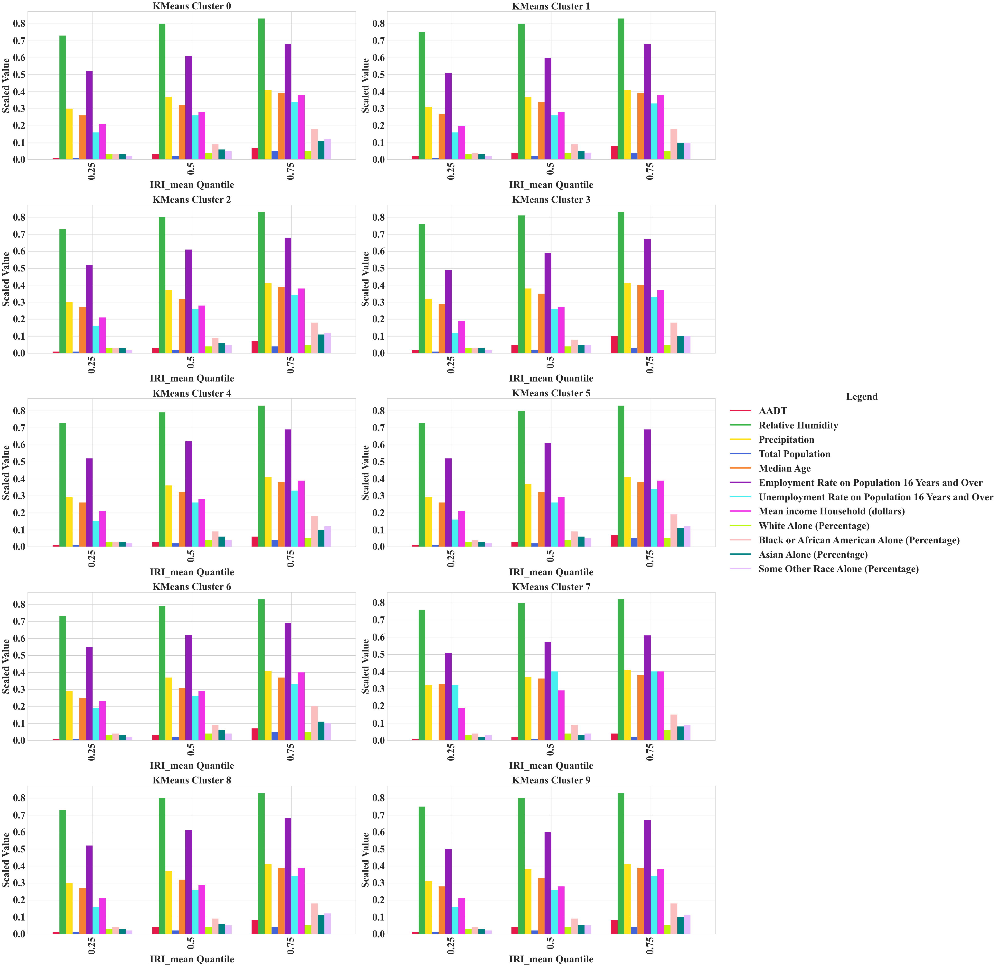

In [ ]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 30  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Setting font globally to Times New Roman, increasing default font size, and setting it to bold
plt.rcParams['font.size'] = 16  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Setup for the demonstration, specifically for k-means clustering
clusters_kmeans = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
quantiles_IRI_kmeans = [0.25, 0.50, 0.75]

# Expanded color palette for greater variation
colors = [
    '#e6194b',  # Bright Red
    '#3cb44b',  # Bright Green
    '#ffe119',  # Bright Yellow
    '#4363d8',  # Bright Blue
    '#f58231',  # Bright Orange
    '#911eb4',  # Purple
    '#46f0f0',  # Cyan
    '#f032e6',  # Magenta
    '#bcf60c',  # Lime
    '#fabebe',  # Pink
    '#008080',  # Teal
    '#e6beff'   # Lavender
]

columns_to_plot_kmeans = ['AADT', 'Relative Humidity',
       'Precipitation', 'Total Population', 'Median Age',
       'Employment Rate on Population 16 Years and Over',
       'Unemployment Rate on Population 16 Years and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage) ',
       'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)']

# Calculate the layout for subplots: up to 2 per row for the k-means clusters
n_rows_kmeans = -(-len(clusters_kmeans) // 2)  # Ceiling division to determine number of rows needed
fig, axes = plt.subplots(n_rows_kmeans, 2, figsize=(35, 8 * n_rows_kmeans))  # Adjust height based on the number of rows, increase figure size for clarity

# Flatten axes array for easy iteration if there are multiple rows
axes = axes.flatten()

for index, cluster in enumerate(clusters_kmeans):
    # Assuming scaled_data is defined somewhere before this snippet
    cluster_data_kmeans = scaled_data[scaled_data['kmeans_data_cluster'] == cluster]
    cluster_data_kmeans = cluster_data_kmeans[columns_to_plot_kmeans]
    cluster_quantiles_kmeans = cluster_data_kmeans.quantile(quantiles_IRI_kmeans).round(2)

    # Plot each cluster's quantiles, specifically for k-means
    cluster_quantiles_kmeans.plot(kind='bar', color=colors[:len(columns_to_plot_kmeans)], ax=axes[index], width=0.8, legend=False, fontsize=14)

    # Set titles, labels bold
    axes[index].set_title(f"KMeans Cluster {cluster}", fontsize=30, weight='bold')
    axes[index].set_xlabel('IRI_mean Quantile', fontsize=30, weight='bold')
    axes[index].set_ylabel('Scaled Value', fontsize=30, weight='bold')
    for label in (axes[index].get_xticklabels() + axes[index].get_yticklabels()):
        label.set_fontsize(30)
        label.set_weight('bold')

# Hide unused axes if the number of clusters is not a multiple of 5
for ax in axes[index+1:]:
    ax.set_visible(False)

# Place the legend outside the plotting area to avoid overlap, specifically for k-means
legend_elements = [plt.Line2D([0], [0], color=color, lw=4, label=col_name) for color, col_name in zip(colors, columns_to_plot_kmeans)]
legend = fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.85, 0.5),  title='Legend', fontsize=30, title_fontsize=30)
plt.setp(legend.get_title(), weight='bold')  # Set legend title bold

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust to fit legend and prevent clipping, adjust rect as per the increased font size
plt.savefig('k-means_patterns_all_variables_large_bold_fonts.jpg')
plt.show()


## Check urbanality and rurarilty  after kmeans

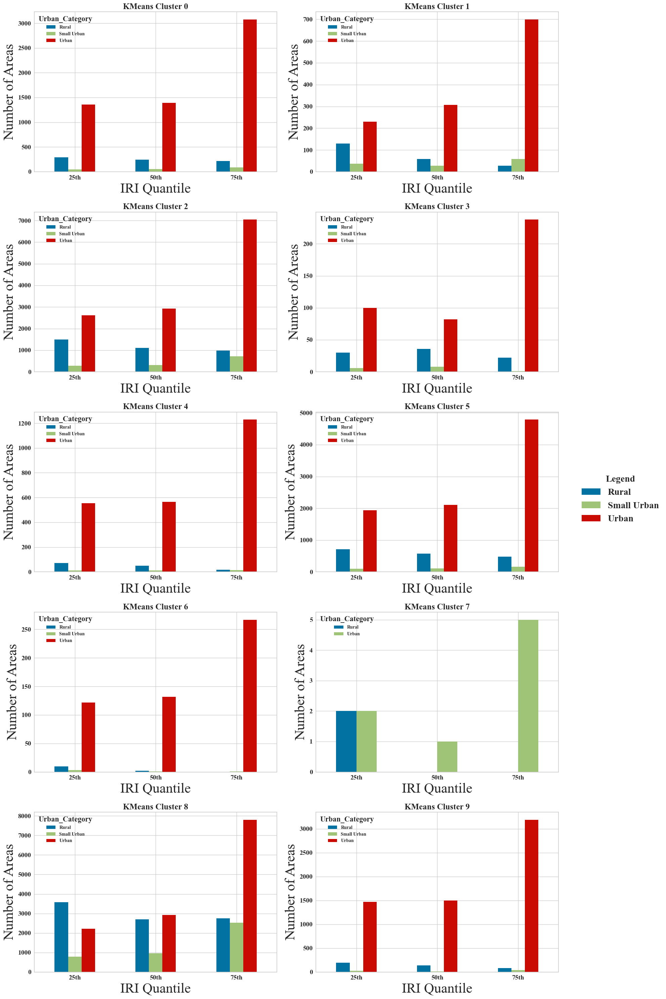

In [ ]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
matplotlib.rcParams['font.size'] = 16  # Increasing the base font size
matplotlib.rcParams['font.weight'] = 'bold'  # Making the font bold

# Setting font globally to Times New Roman, increasing default font size, and making it bold
matplotlib.rcParams['font.family'] = 'Times New Roman'
matplotlib.rcParams['font.size'] = 16  # Increasing the base font size
matplotlib.rcParams['font.weight'] = 'bold'  # Making the font bold

# Assuming scaled_data is defined and includes 'Urban_Code_mode_encoded' and 'kmeans_data_cluster' columns
# Replace 'pd2' with 'pd' in the import statement as 'pd2' seems to be a typo

# Mapping of numeric codes to labels
urban_code_labels = {
    0: 'Rural',
    1: 'Small Urban',
    2: 'Urban'
}

# Replace numeric codes with labels in the DataFrame
scaled_data['Urban_Category'] = scaled_data['Urban_Code_mode_encoded'].map(urban_code_labels)

# Determine the number of clusters for setting up the subplot grid
num_clusters = scaled_data['kmeans_data_cluster'].nunique()
clusters_per_row = 2  # Define how many clusters you want per row in the subplot
rows_needed = -(-num_clusters // clusters_per_row)  # Ceiling division to determine rows needed

# Create a figure with subplots
fig, axs = plt.subplots(rows_needed, clusters_per_row, figsize=(20, rows_needed * 6))  # Adjust figsize as needed
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing between plots

# Flatten the axs array for easy iteration if there are multiple rows
if rows_needed * clusters_per_row > 1:
    axs = axs.flatten()

# Function to categorize by quantile
def categorize_by_quantile(value, quantiles):
    if value <= quantiles[0.25]:
        return '25th'
    elif value <= quantiles[0.5]:
        return '50th'
    else:
        return '75th'

# Loop through each cluster to plot
for index, cluster in enumerate(sorted(scaled_data['kmeans_data_cluster'].unique())):
    cluster_data = scaled_data[scaled_data['kmeans_data_cluster'] == cluster].copy()
    quantiles = cluster_data['IRI'].quantile([0.25, 0.5, 0.75])

    # Categorize each row by its quantile
    cluster_data['quantile_category'] = cluster_data['IRI'].apply(lambda x: categorize_by_quantile(x, quantiles))

    # Create a pivot table for plotting
    pivot_df = cluster_data.pivot_table(index='quantile_category', columns='Urban_Category', aggfunc='size', fill_value=0)

    # Plotting for the current cluster on its subplot
    pivot_df.plot(kind='bar', ax=axs[index], title=f"KMeans Cluster {cluster}", legend=True, fontsize=14)
    axs[index].set_xlabel('IRI Quantile', fontsize=30)
    axs[index].set_ylabel('Number of Areas', fontsize=30)
    axs[index].tick_params(axis='x', rotation=0)
    axs[index].set_title(f'KMeans Cluster {cluster}', fontsize=18, weight='bold')

# Adjust or hide axes for any unused subplot slots if your number of clusters isn't a multiple of clusters_per_row
if rows_needed * clusters_per_row > 1:
    for ax in axs[num_clusters:]:
        ax.axis('off')

# Show the legend outside the last subplot to avoid overlap
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center right', bbox_to_anchor=(1, 0.5), title='Legend', fontsize=20, title_fontsize=20)

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.savefig('k-means_urbanality_bold_fonts.jpg')
plt.show()


## Check centroid of the clousters

In [ ]:
centroids = kmeans.cluster_centers_
centroids_ = pd.DataFrame(centroids, columns=data.columns[1:])  # Adjust the index as needed
centroids_.to_csv('centroids_kmeans.csv')

In [ ]:
centroids_

,Year,IRI,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster
0,29423.106197,2018.801657,123.397414,1.749297,70.957181,1082.861338,6.072939e+05,38.707721,61.111167,3.789587,93243.596953,63.342311,12.918246,4.404807,6.610416
1,28740.534645,2018.601523,133.036080,1.646574,53.658841,754.966742,2.134892e+06,36.830330,61.614530,3.990165,90966.493020,58.480631,12.133201,8.331478,9.945036
2,19652.883811,2018.730982,117.993181,1.516155,72.933319,1143.323372,2.357499e+05,39.477104,59.370853,3.921637,84381.027694,91.863802,10.226263,2.991213,4.077635
3,55825.971319,2018.275335,116.370554,1.634799,52.004207,604.578203,4.605889e+06,35.814340,62.135755,3.766157,90904.177820,70.220086,12.324447,5.541543,7.197518
4,39911.765032,2019.057358,122.441344,1.874604,70.355356,1034.680868,1.275050e+06,37.072706,62.079549,4.316377,91736.933347,45.078760,15.724865,5.925388,9.995325
5,25933.280427,2018.974989,115.350065,1.644020,72.833667,1124.374404,3.949946e+05,39.324275,58.981246,4.205839,87105.905366,70.614844,10.344250,3.239523,6.087141
6,29308.946097,2019.315985,162.412288,1.946097,73.096063,1116.680447,2.608801e+06,36.690520,62.258922,4.657621,89117.981413,35.711122,19.285235,5.277431,15.502900
7,102475.000000,2018.000000,179.400000,1.600000,55.900000,349.700000,1.010552e+07,36.700000,61.300000,5.600000,98977.000000,51.299815,8.030029,14.769693,20.548665
8,15466.700076,2018.630554,108.186828,1.147457,72.999136,1140.867645,1.155416e+05,40.120730,57.118257,4.013179,76260.832945,112.089838,7.588048,2.479138,3.309848
9,34169.717895,2018.572782,141.452049,1.863158,73.090834,1201.367834,8.929458e+05,38.367594,61.253654,4.086526,101111.206992,53.279442,13.078417,10.177979,7.323226


In [ ]:
centroids_.iloc[0]

Year                                                  29423.106197
IRI                                                    2018.801657
Urban_Code_mode_encoded                                 123.397414
Relative Humidity                                         1.749297
Precipitation                                            70.957181
Total Population                                       1082.861338
Median Age                                           607293.887147
Employment Rate on Population 16 Years and Over          38.707721
Unemployment Rate on Population 16 Years and Over        61.111167
Mean income Household (dollars)                           3.789587
White Alone (Percentage)                              93243.596953
Black or African American Alone (Percentage)             63.342311
Asian Alone (Percentage)                                 12.918246
Some Other Race Alone (Percentage)                        4.404807
kmeans_data_cluster                                       6.61

In [ ]:
centroids_.iat[0, 1]  # First row, first column

2018.8016565596806

In [ ]:
kmeans.labels_

array([8, 8, 8, ..., 8, 8, 8])

In [ ]:
# Get the column index of `Mean income Household (dollars)`
centroids_.columns.get_loc('Mean income Household (dollars)')

9

## Hierarchical clutering

## Linkage method = centroid

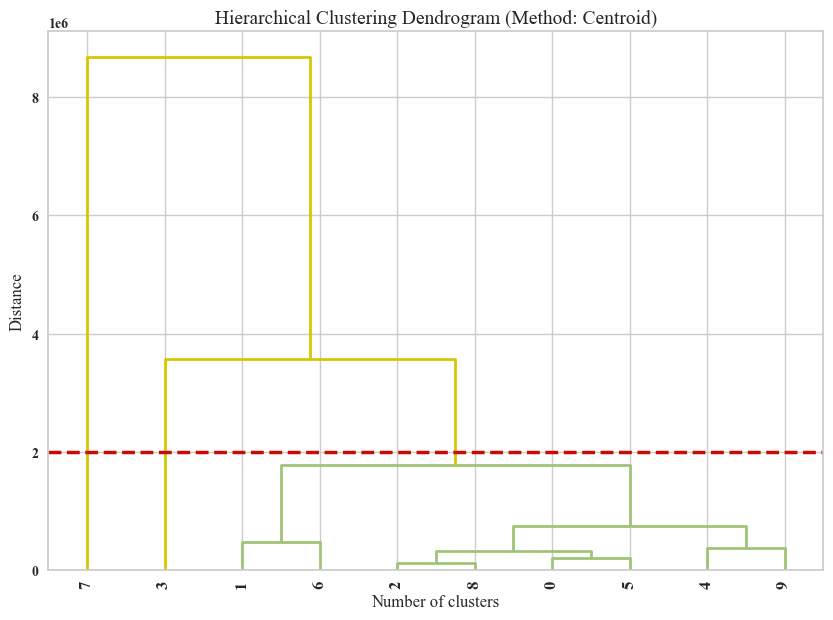

In [ ]:
# Your hierarchical clustering code as provided
Z = linkage(centroids_, method='centroid')

# Generating labels for the dendrogram based on centroid indices
labels = centroids_.index.astype(str).tolist()

# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 20  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Adjusting plot size and title
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram (Method: Centroid)', fontsize=14)

# Plot adjustments for clarity and aesthetics
plt.rcParams['lines.linewidth'] = 2  # Increase line width
plt.rcParams['lines.color'] = 'b'    # This won't directly affect dendrogram lines, but useful for other plot lines
plt.rcParams['axes.labelsize'] = 12  # Increase font size for the x and y labels
plt.rcParams['xtick.labelsize'] = 10 # Increase font size for the x-axis tick labels
plt.rcParams['ytick.labelsize'] = 10 # Increase font size for the y-axis tick labels

# Creating the dendrogram with adjustments
dend = dendrogram(Z, labels=labels, above_threshold_color='y', orientation='top', leaf_rotation=90, leaf_font_size=12, color_threshold=2e6)

# Drawing a horizontal line with increased visibility
plt.axhline(y=2e6, color='r', linestyle='--', linewidth=2.5)

# Labels for the plot
plt.xlabel('Number of clusters', fontsize=12)
plt.ylabel('Distance', fontsize=12)

# Saving the figure with increased readability
plt.savefig("Centroid_method_Hierarchical Clustering.jpg", dpi=300)  # Increase dpi for better quality
plt.show()


In [ ]:
print(dend['color_list'])

['C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'y', 'y']


## Linkage method = average

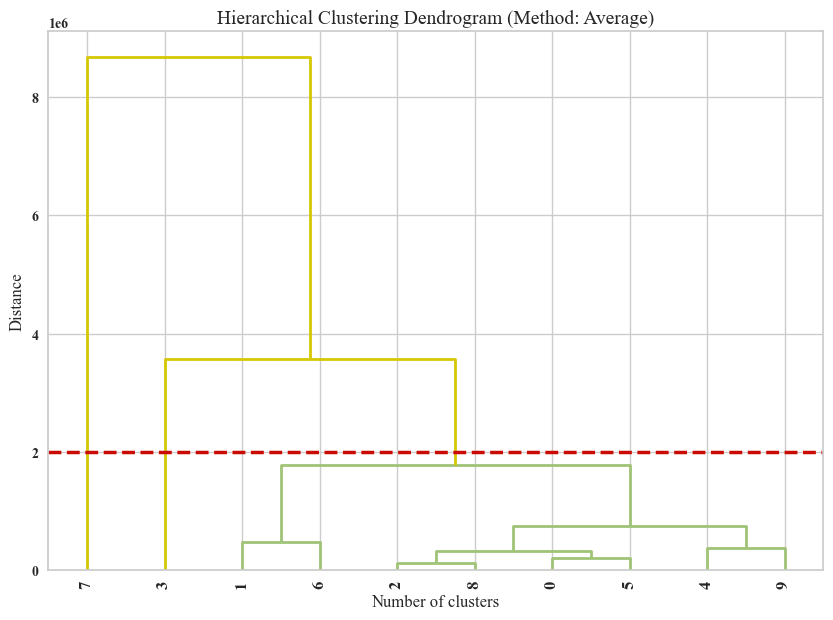

In [ ]:
# Your hierarchical clustering code as provided
Z = linkage(centroids_, method='average')

# Generating labels for the dendrogram based on centroid indices
labels = centroids_.index.astype(str).tolist()

# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 20  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Adjusting plot size and title
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram (Method: Average)', fontsize=14)

# Plot adjustments for clarity and aesthetics
plt.rcParams['lines.linewidth'] = 2  # Increase line width
plt.rcParams['lines.color'] = 'b'    # This won't directly affect dendrogram lines, but useful for other plot lines
plt.rcParams['axes.labelsize'] = 12  # Increase font size for the x and y labels
plt.rcParams['xtick.labelsize'] = 10 # Increase font size for the x-axis tick labels
plt.rcParams['ytick.labelsize'] = 10 # Increase font size for the y-axis tick labels

# Creating the dendrogram with adjustments
dend = dendrogram(Z, labels=labels, above_threshold_color='y', orientation='top', leaf_rotation=90, leaf_font_size=12, color_threshold=2e6)

# Drawing a horizontal line with increased visibility
plt.axhline(y=2e6, color='r', linestyle='--', linewidth=2.5)

# Labels for the plot
plt.xlabel('Number of clusters', fontsize=12)
plt.ylabel('Distance', fontsize=12)

# Saving the figure with increased readability
plt.savefig("Average_method_Hierarchical Clustering.jpg", dpi=300)  # Increase dpi for better quality
plt.show()


In [ ]:
print(dend['color_list'])

['C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'y', 'y']


## Linkage method = ward

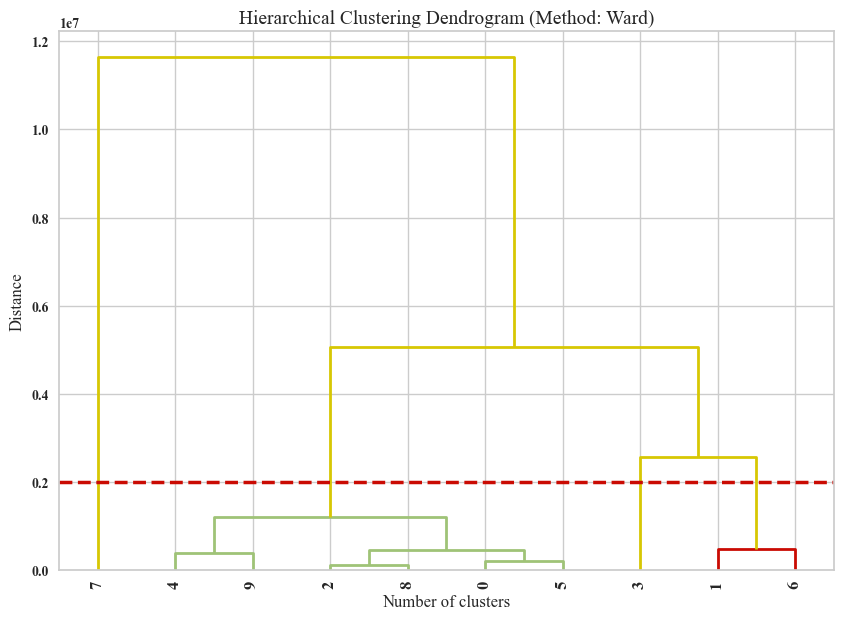

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Assuming your centroids_ is correctly obtained and centroids_kmeans dataframe is ready
# Your hierarchical clustering code as provided
Z = linkage(centroids_, method='ward')

# Generating labels for the dendrogram based on centroid indices
labels = centroids_.index.astype(str).tolist()

# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 20  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Adjusting plot size and title
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram (Method: Ward)', fontsize=14)

# Plot adjustments for clarity and aesthetics
plt.rcParams['lines.linewidth'] = 2  # Increase line width
plt.rcParams['lines.color'] = 'b'    # This won't directly affect dendrogram lines, but useful for other plot lines
plt.rcParams['axes.labelsize'] = 12  # Increase font size for the x and y labels
plt.rcParams['xtick.labelsize'] = 10 # Increase font size for the x-axis tick labels
plt.rcParams['ytick.labelsize'] = 10 # Increase font size for the y-axis tick labels

# Creating the dendrogram with adjustments
dend = dendrogram(Z, labels=labels, above_threshold_color='y', orientation='top', leaf_rotation=90, leaf_font_size=12, color_threshold=2e6)

# Drawing a horizontal line with increased visibility
plt.axhline(y=2e6, color='r', linestyle='--', linewidth=2.5)

# Labels for the plot
plt.xlabel('Number of clusters', fontsize=12)
plt.ylabel('Distance', fontsize=12)

# Saving the figure with increased readability
plt.savefig("Ward_method_Hierarchical Clustering.jpg", dpi=300)  # Increase dpi for better quality
plt.show()


In [ ]:
print(dend['color_list'])

['C1', 'C1', 'C1', 'C1', 'C1', 'C2', 'y', 'y', 'y']


## Method: complete

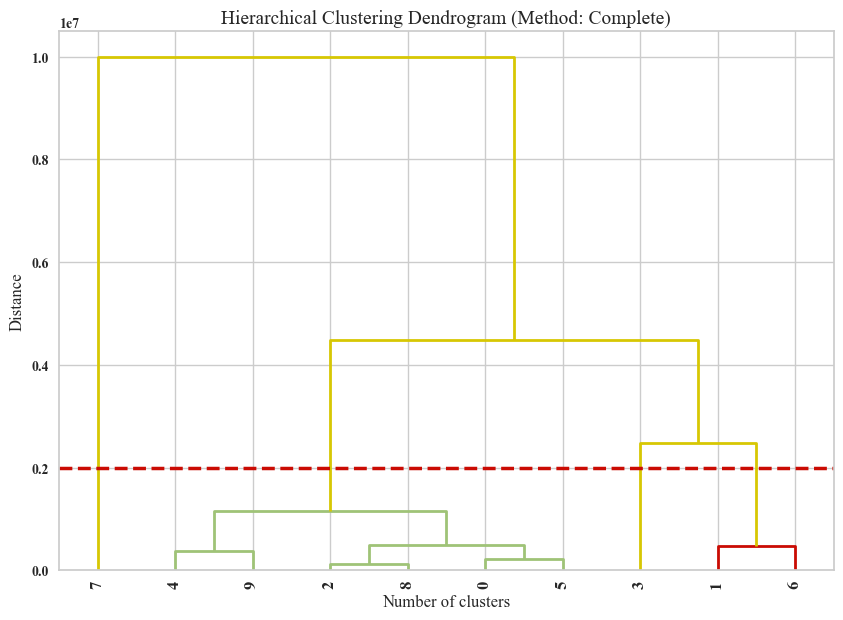

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Assuming your centroids_ is correctly obtained and centroids_kmeans dataframe is ready
# Your hierarchical clustering code as provided
Z = linkage(centroids_, method='complete')

# Generating labels for the dendrogram based on centroid indices
labels = centroids_.index.astype(str).tolist()

# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 20  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Adjusting plot size and title
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram (Method: Complete)', fontsize=14)

# Plot adjustments for clarity and aesthetics
plt.rcParams['lines.linewidth'] = 2  # Increase line width
plt.rcParams['lines.color'] = 'b'    # This won't directly affect dendrogram lines, but useful for other plot lines
plt.rcParams['axes.labelsize'] = 12  # Increase font size for the x and y labels
plt.rcParams['xtick.labelsize'] = 10 # Increase font size for the x-axis tick labels
plt.rcParams['ytick.labelsize'] = 10 # Increase font size for the y-axis tick labels

# Creating the dendrogram with adjustments
dend = dendrogram(Z, labels=labels, above_threshold_color='y', orientation='top', leaf_rotation=90, leaf_font_size=12, color_threshold=2e6)

# Drawing a horizontal line with increased visibility
plt.axhline(y=2e6, color='r', linestyle='--', linewidth=2.5)

# Labels for the plot
plt.xlabel('Number of clusters', fontsize=12)
plt.ylabel('Distance', fontsize=12)

# Saving the figure with increased readability
plt.savefig("complete_method_Hierarchical Clustering.jpg", dpi=300)  # Increase dpi for better quality
plt.show()


In [ ]:
## see this to understand the optimal number of clusters: https://www.youtube.com/watch?v=4DInt3H2UNE
## another source: https://www.analyticsvidhya.com/blog/2019/05/beginners-guide-hierarchical-clustering/

print(dend['color_list'])

['C1', 'C1', 'C1', 'C1', 'C1', 'C2', 'y', 'y', 'y']


## Agglomerative CLsutering
source: https://www.kaggle.com/code/heeraldedhia/hierarchical-clustering-for-customer-data

guide: https://www.analyticsvidhya.com/blog/2019/05/beginners-guide-hierarchical-clustering/

## Check silhoutte score

In [ ]:
from sklearn.cluster import AgglomerativeClustering

silhouette_scores = []

# Iterate over the desired range of cluster numbers
for n_clusters in range(2, 5):  # 2 to 4 clusters
    # Create an instance of AgglomerativeClustering for the current number of clusters
    hc = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='ward')

    # Fit the model and predict the cluster labels
    y_hc = hc.fit_predict(data)

    # Calculate the silhouette score for the current clustering
    score = silhouette_score(data, y_hc)
    score = f"{score:.2f}"  # This will format the score to have two decimal places

    # Print the silhouette score
    print(f"Silhouette Score for {n_clusters} clusters: {score}")

    # Store the score
    silhouette_scores.append(score)

# You can further analyze the silhouette_scores list to find the optimal number of clusters based on your criteria.


C:\Users\tadnan\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Silhouette Score for 2 clusters: 0.85


C:\Users\tadnan\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Silhouette Score for 3 clusters: 0.70


C:\Users\tadnan\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Silhouette Score for 4 clusters: 0.71


## Check Boudlin Score

In [ ]:
# Initialize a list to store Davies-Bouldin scores for different numbers of clusters
davies_bouldin_scores = []

# Iterate over the desired range of cluster numbers
for n_clusters in range(2, 5):  # 2 to 4 clusters
    # Create an instance of AgglomerativeClustering for the current number of clusters
    hc = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='ward')

    # Fit the model and predict the cluster labels
    y_hc = hc.fit_predict(data)

    # Calculate the Davies-Bouldin score for the current clustering
    score = davies_bouldin_score(data, y_hc)
    score = f"{score:.2f}"  # This will format the score to have two decimal places

    # Print the Davies-Bouldin score
    print(f"Davies-Bouldin Score for {n_clusters} clusters: {score}")

    # Store the score
    davies_bouldin_scores.append(score)



C:\Users\tadnan\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Davies-Bouldin Score for 2 clusters: 0.43


C:\Users\tadnan\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Davies-Bouldin Score for 3 clusters: 0.50


C:\Users\tadnan\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Davies-Bouldin Score for 4 clusters: 0.34


## Finally Select the number of clusters in the Final Step

In [ ]:
hc = AgglomerativeClustering(n_clusters = 4, affinity = 'euclidean', linkage ='ward')

y_hc = hc.fit_predict(data)

C:\Users\tadnan\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [ ]:
hc.feature_names_in_

array(['AADT', 'Year', 'IRI', 'Urban_Code_mode_encoded',
       'Relative Humidity', 'Precipitation', 'Total Population',
       'Median Age', 'Employment Rate on Population 16 Years and Over',
       'Unemployment Rate on Population 16 Years and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage) ',
       'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)',
       'kmeans_data_cluster'], dtype=object)

In [ ]:
Hierarchical_cluster = pd.DataFrame(y_hc)
Hierarchical_cluster.head(100)

,0
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,1


In [ ]:
data.insert((data.shape[1]),'Hierarchical_cluster',Hierarchical_cluster)

In [ ]:
data.shape

(73280, 17)

In [ ]:
save = data.head(20)
save.to_csv('Final_outputs.csv')

In [ ]:
type(data)

pandas.core.frame.DataFrame

In [ ]:
data.describe()

,AADT,Year,IRI,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster,Hierarchical_cluster
count,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,7.328000e+04,73280.000000,73280.000000,73280.00000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000,73280.000000
mean,22554.848511,2018.733338,117.524537,1.475955,72.119862,1123.043876,4.373218e+05,39.325333,59.022880,4.01934,84706.804599,86.856144,10.121599,3.881008,5.072099,5.132178,0.396056
std,29887.070170,1.135507,70.511227,0.828270,11.106328,380.564073,5.743514e+05,4.613666,5.622422,2.07146,19065.743338,95.448771,10.797173,5.480301,6.146912,3.086643,0.845301
min,2.000000,2017.000000,30.000000,0.000000,30.000000,94.200000,6.238500e+04,24.800000,34.000000,0.20000,43172.000000,2.436337,0.079000,0.000000,0.000000,0.000000,0.000000
25%,4545.000000,2018.000000,65.000000,1.000000,72.115401,1008.600000,1.360340e+05,36.600000,55.900000,2.50000,71305.000000,62.116862,2.632970,1.308556,1.166532,2.000000,0.000000
50%,12600.500000,2019.000000,97.300000,2.000000,76.000000,1226.910615,2.426410e+05,39.100000,59.700000,4.00000,81281.000000,79.001363,6.547694,2.340935,2.781459,5.000000,0.000000
75%,27700.000000,2020.000000,151.000000,2.000000,77.600000,1358.561000,5.088820e+05,42.000000,62.700000,5.20000,94576.000000,90.130845,13.507121,4.507610,6.800216,8.000000,0.000000
max,373000.000000,2020.000000,615.000000,2.000000,87.600000,3145.300000,1.010552e+07,69.000000,76.100000,14.80000,176974.000000,1906.362549,73.291523,42.225941,57.934381,9.000000,3.000000


In [ ]:
## see same max population for same areas with different IRI. so calculating mean or median and comparison based on median or mean are efficient here
data[data['Total Population'] == 5211263.0]

,AADT,Year,IRI,Urban_Code_mode_encoded,Relative Humidity,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster,Hierarchical_cluster
5564,209198.0,2017,110.3,2,75.8,1081.6,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,1
5565,179974.0,2017,102.6,2,75.8,1081.6,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,1
5566,112806.0,2017,96.7,2,75.8,1081.6,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,1
5567,32069.0,2017,127.0,2,75.8,1081.6,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,1
5568,61380.0,2017,91.0,2,75.8,1081.6,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,1
5569,9050.0,2017,165.0,2,75.8,1081.6,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,1
5570,19319.0,2017,183.0,2,75.8,1081.6,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,1
5571,41200.0,2017,171.0,2,75.8,1081.6,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,1
5572,73312.0,2017,109.0,2,75.8,1081.6,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,1
5573,50000.0,2017,115.0,2,75.8,1081.6,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,1


## Check all variables by IRI_mean in all cluster

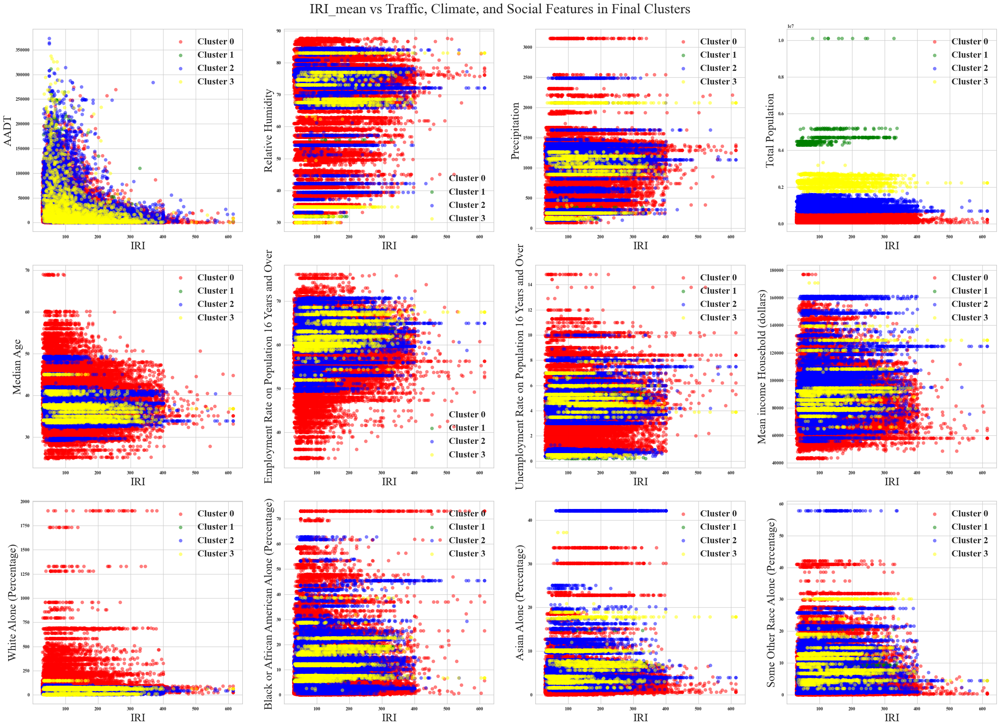

In [ ]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster', 'Hierarchical_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = [col for col in data.columns if col not in exclude_columns and data[col].dtype in ['float64', 'int64']]

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Fixed number of columns
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, n_rows * 8))  # Adjusted figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - assuming up to 6 clusters for now, add more colors if you have more clusters
colors = ['red', 'green', 'blue', 'yellow', 'purple', 'orange']

# Adjust font sizes
axis_label_font_size = 24  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(4):  # Adjust range as per the number of clusters you have
        cluster_data = data[data['Hierarchical_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    # ax.set_title(f'IRI_mean vs {y_column}', fontsize=title_font_size)
    ax.legend(fontsize=20)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

plt.suptitle('IRI_mean vs Traffic, Climate, and Social Features in Final Clusters', fontsize=30,  y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.savefig("_clusters_in_Hierarchical.jpg")
plt.show()


## Check correlations in cluster 1

In [ ]:
# Select data for cluster 1
cluster_1 = data[data['Hierarchical_cluster'] == 0]

In [ ]:
## Check Unique kmeans
cluster_1['kmeans_data_cluster'].unique()

array([8, 5, 2, 0])

C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\401871357.py:33: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_annotations = correlations_df.applymap(lambda x: f'{x:.2f}')


<Figure size 1000x1000 with 0 Axes>

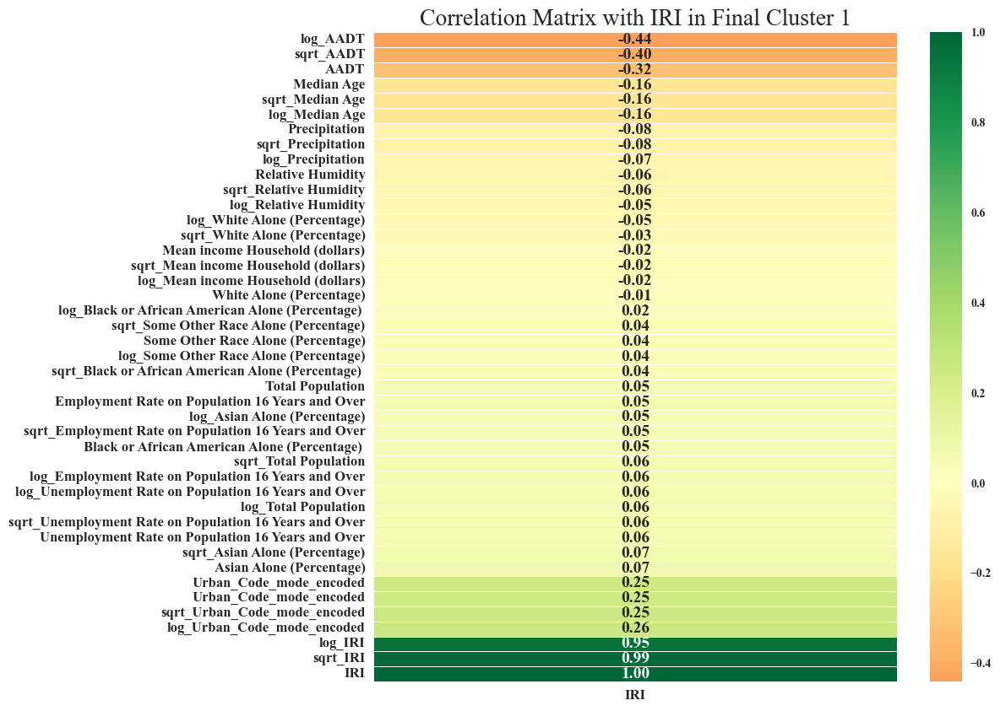

In [ ]:
# Exclude 'Urban_Code_mode_encoded' column
cluster_1_excluded = cluster_1.drop(columns=['Year', 'kmeans_data_cluster', 'Hierarchical_cluster'])

# Select the numeric columns
numeric_subset = cluster_1_excluded.select_dtypes(include='number')

# Create columns with square root and log of numeric columns
for col in numeric_subset.columns:
    # Add a small constant to avoid taking log of zero
    numeric_subset['sqrt_' + col] = np.sqrt(numeric_subset[col])
    numeric_subset['log_' + col] = np.log(numeric_subset[col] + 1e-9)

# Select the categorical columns
categorical_subset = cluster_1[['Urban_Code_mode_encoded']]

# One hot encode
categorical_subset = pd.get_dummies(categorical_subset)

# Join the two dataframes using concat
# Make sure to use axis = 1 to perform a column bind
features = pd.concat([numeric_subset, categorical_subset], axis=1)

# Drop rows without an energy IRI_mean
features = features.dropna(subset=['IRI'])

# Find correlations with the IRI_mean
correlations = features.corr()['IRI'].dropna().sort_values()

# Convert correlations to DataFrame for seaborn heatmap compatibility
correlations_df = correlations.to_frame()  # Convert Series to DataFrame

# Prepare annotations: convert each correlation value to a string formatted to two decimal places
formatted_annotations = correlations_df.applymap(lambda x: f'{x:.2f}')

## Set fonts
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 14

# Plot the heatmap
plt.figure(figsize=(10, 10))

# Plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(correlations_df, annot=formatted_annotations.values, fmt="", linewidths=.5, cmap="RdYlGn", center=0,
            annot_kws={"size": 14})

plt.title('Correlation Matrix with IRI in Final Cluster 1', fontsize=20)  # Adjust title font size here
plt.xticks(fontsize=12)  # Adjust x-axis label font size here
plt.yticks(fontsize=12)  # Adjust y-axis label font size here
plt.savefig('Correlation Matrix with IRI_mean in cluster 1.jpg')
plt.show()

## Check cluster 2

In [ ]:
# Select data for cluster 1
cluster_2 = data[data['Hierarchical_cluster'] == 1]

In [ ]:
## Check Unique kmeans
cluster_2['kmeans_data_cluster'].unique()

array([3, 7])

C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\1934896500.py:33: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_annotations = correlations_df.applymap(lambda x: f'{x:.2f}')


<Figure size 1000x1000 with 0 Axes>

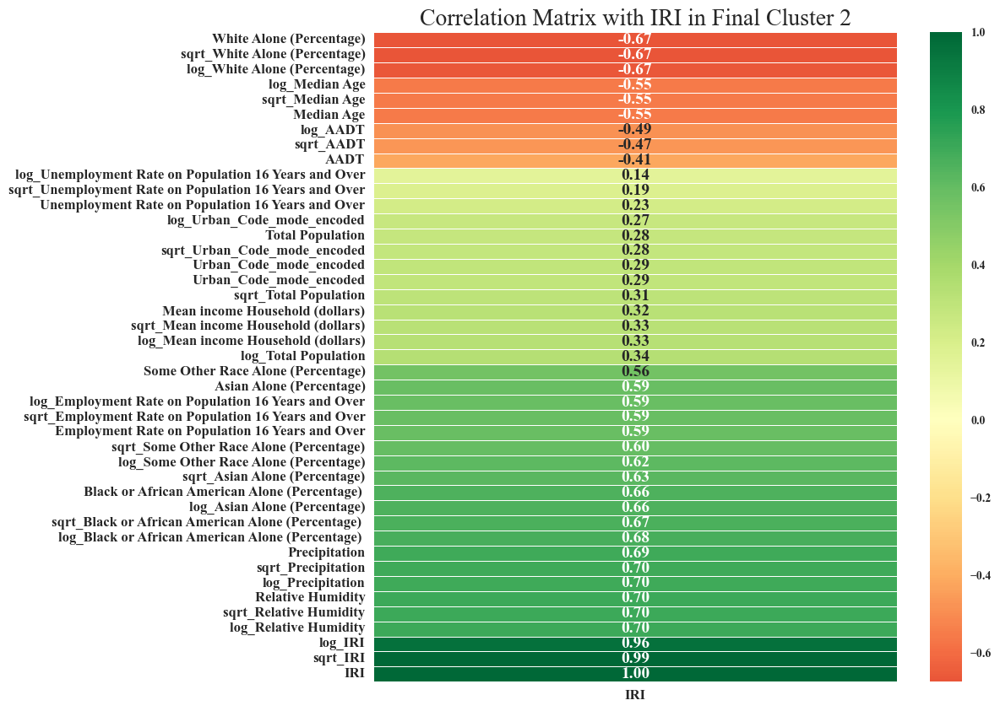

In [ ]:
# Exclude 'Urban_Code_mode_encoded' column
cluster_2_excluded = cluster_2.drop(columns=['Year','kmeans_data_cluster', 'Hierarchical_cluster'])

# Select the numeric columns
numeric_subset = cluster_2_excluded.select_dtypes(include='number')

# Create columns with square root and log of numeric columns
for col in numeric_subset.columns:
    # Add a small constant to avoid taking log of zero
    numeric_subset['sqrt_' + col] = np.sqrt(numeric_subset[col])
    numeric_subset['log_' + col] = np.log(numeric_subset[col] + 1e-9)

# Select the categorical columns
categorical_subset = cluster_2[['Urban_Code_mode_encoded']]

# One hot encode
categorical_subset = pd.get_dummies(categorical_subset)

# Join the two dataframes using concat
# Make sure to use axis = 1 to perform a column bind
features = pd.concat([numeric_subset, categorical_subset], axis=1)

# Drop rows without an energy IRI_mean
features = features.dropna(subset=['IRI'])

# Find correlations with the IRI_mean
correlations = features.corr()['IRI'].dropna().sort_values()

# Convert correlations to DataFrame for seaborn heatmap compatibility
correlations_df = correlations.to_frame()  # Convert Series to DataFrame

# Prepare annotations: convert each correlation value to a string formatted to two decimal places
formatted_annotations = correlations_df.applymap(lambda x: f'{x:.2f}')

## Set fonts
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 14

# Plot the heatmap
plt.figure(figsize=(10, 10))

# Plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(correlations_df, annot=formatted_annotations.values, fmt="", linewidths=.5, cmap="RdYlGn", center=0,
            annot_kws={"size": 14})

plt.title('Correlation Matrix with IRI in Final Cluster 2', fontsize=20)  # Adjust title font size here
plt.xticks(fontsize=12)  # Adjust x-axis label font size here
plt.yticks(fontsize=12)  # Adjust y-axis label font size here
plt.savefig('Correlation Matrix with IRI_mean in cluster 2.jpg')
plt.show()

## Check cluster 3

In [ ]:
# Select data for cluster 1
cluster_3 = data[data['Hierarchical_cluster'] == 2]

In [ ]:
## Check Unique kmeans
cluster_3['kmeans_data_cluster'].unique()

array([4, 9, 0])

C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\1260656285.py:33: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_annotations = correlations_df.applymap(lambda x: f'{x:.2f}')


<Figure size 1000x1000 with 0 Axes>

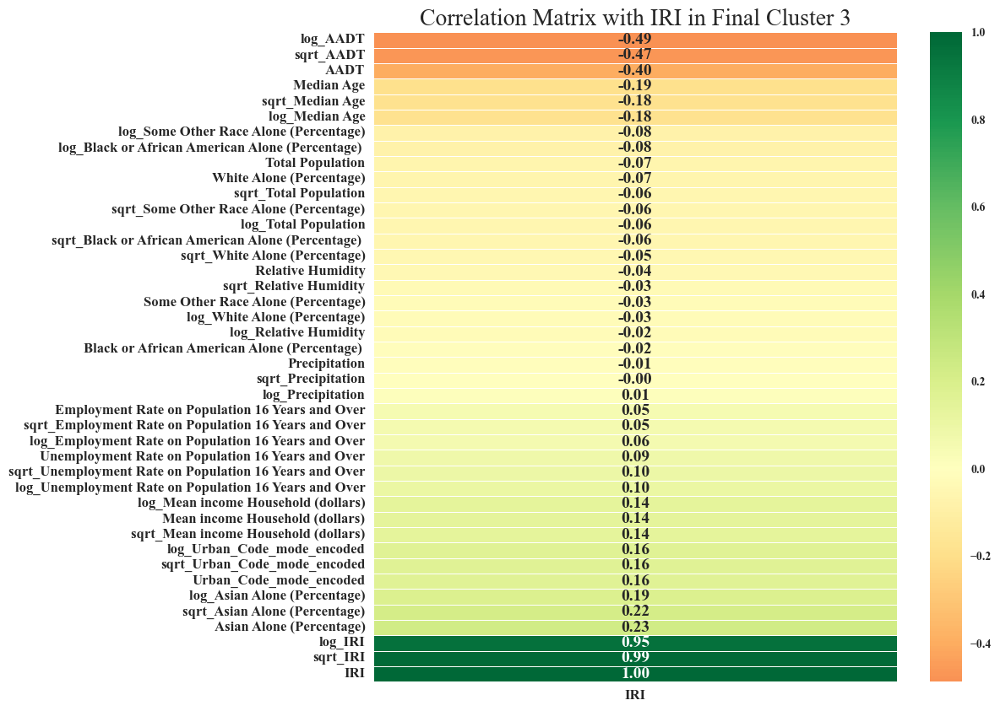

In [ ]:
# Exclude 'Urban_Code_mode_encoded' column
cluster_3_excluded = cluster_3.drop(columns=['Year', 'kmeans_data_cluster', 'Hierarchical_cluster'])

# Select the numeric columns
numeric_subset = cluster_3_excluded.select_dtypes(include='number')

# Create columns with square root and log of numeric columns
for col in numeric_subset.columns:
    # Add a small constant to avoid taking log of zero
    numeric_subset['sqrt_' + col] = np.sqrt(numeric_subset[col])
    numeric_subset['log_' + col] = np.log(numeric_subset[col] + 1e-9)

# Select the categorical columns
categorical_subset = cluster_2[['Urban_Code_mode_encoded']]

# One hot encode
categorical_subset = pd.get_dummies(categorical_subset)

# Join the two dataframes using concat
# Make sure to use axis = 1 to perform a column bind
features = pd.concat([numeric_subset, categorical_subset], axis=1)

# Drop rows without an energy IRI_mean
features = features.dropna(subset=['IRI'])

# Find correlations with the IRI_mean
correlations = features.corr()['IRI'].dropna().sort_values()

# Convert correlations to DataFrame for seaborn heatmap compatibility
correlations_df = correlations.to_frame()  # Convert Series to DataFrame

# Prepare annotations: convert each correlation value to a string formatted to two decimal places
formatted_annotations = correlations_df.applymap(lambda x: f'{x:.2f}')

## Set fonts
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 14

# Plot the heatmap
plt.figure(figsize=(10, 10))

# Plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(correlations_df, annot=formatted_annotations.values, fmt="", linewidths=.5, cmap="RdYlGn", center=0,
            annot_kws={"size": 14})

plt.title('Correlation Matrix with IRI in Final Cluster 3', fontsize=20)  # Adjust title font size here
plt.xticks(fontsize=12)  # Adjust x-axis label font size here
plt.yticks(fontsize=12)  # Adjust y-axis label font size here
plt.savefig('Correlation Matrix with IRI_mean in cluster 3.jpg')
plt.show()

## Check cluster 4

In [ ]:
# Select data for cluster 1
cluster_4 = data[data['Hierarchical_cluster'] == 3]

In [ ]:
## Check Unique kmeans
cluster_4['kmeans_data_cluster'].unique()

array([1, 6])

C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\3178280767.py:33: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_annotations = correlations_df.applymap(lambda x: f'{x:.2f}')


<Figure size 1000x1000 with 0 Axes>

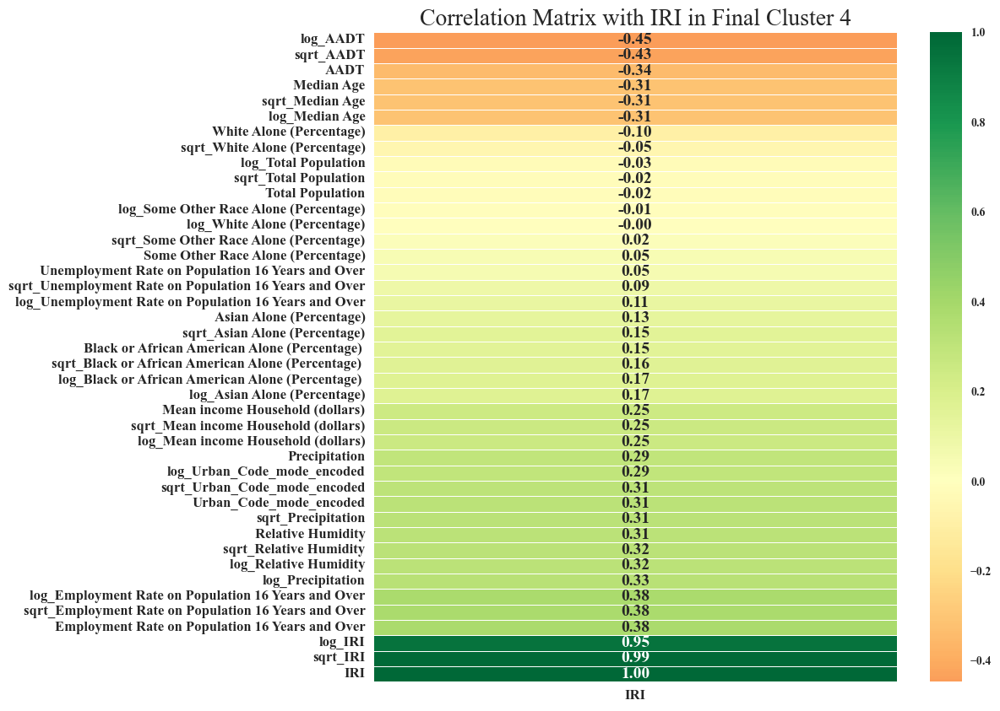

In [ ]:
# Exclude 'Urban_Code_mode_encoded' column
cluster_4_excluded = cluster_4.drop(columns=['Year','kmeans_data_cluster', 'Hierarchical_cluster'])

# Select the numeric columns
numeric_subset = cluster_4_excluded.select_dtypes(include='number')

# Create columns with square root and log of numeric columns
for col in numeric_subset.columns:
    # Add a small constant to avoid taking log of zero
    numeric_subset['sqrt_' + col] = np.sqrt(numeric_subset[col])
    numeric_subset['log_' + col] = np.log(numeric_subset[col] + 1e-9)

# Select the categorical columns
categorical_subset = cluster_2[['Urban_Code_mode_encoded']]

# One hot encode
categorical_subset = pd.get_dummies(categorical_subset)

# Join the two dataframes using concat
# Make sure to use axis = 1 to perform a column bind
features = pd.concat([numeric_subset, categorical_subset], axis=1)

# Drop rows without an energy IRI_mean
# features = features.dropna(subset=['IRI'])

# Find correlations with the IRI_mean
correlations = features.corr()['IRI'].dropna().sort_values()

# Convert correlations to DataFrame for seaborn heatmap compatibility
correlations_df = correlations.to_frame()  # Convert Series to DataFrame

# Prepare annotations: convert each correlation value to a string formatted to two decimal places
formatted_annotations = correlations_df.applymap(lambda x: f'{x:.2f}')

## Set fonts
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 14

# Plot the heatmap
plt.figure(figsize=(10, 10))

# Plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(correlations_df, annot=formatted_annotations.values, fmt="", linewidths=.5, cmap="RdYlGn", center=0,
            annot_kws={"size": 14})

plt.title('Correlation Matrix with IRI in Final Cluster 4', fontsize=20)  # Adjust title font size here
plt.xticks(fontsize=12)  # Adjust x-axis label font size here
plt.yticks(fontsize=12)  # Adjust y-axis label font size here
plt.savefig('Correlation Matrix with IRI_mean in cluster 4.jpg')
plt.show()

## Now scaling is important visualiza the parameters in the same scale

In [ ]:
# Step 1: Import necessary libraries and modules.
from sklearn.preprocessing import MinMaxScaler

# Step 2: Define the list of columns to remove from the dataframe.
columns_to_remove = ['Year', 'Urban_Code_mode_encoded', 'IRI', 'kmeans_data_cluster', 'Hierarchical_cluster']

# Step 3: Get the locations of the columns to remove in the dataframe.
column_indices_to_remove = [data.columns.get_loc(col) for col in columns_to_remove]

In [ ]:

# Step 4: Remove the specified columns from the dataframe.
removed_columns_data = data[columns_to_remove]
additional_data = data.drop(columns=columns_to_remove)

# Step 5: Separate columns you want to scale.
columns_to_scale = additional_data.columns

# Step 6: Scale only the selected columns using MinMaxScaler.
scaler = MinMaxScaler()
scaled_data_array = scaler.fit_transform(additional_data)

# Step 7: Convert scaled_data_array to DataFrame.
scaled_data_df = pd.DataFrame(scaled_data_array, columns=columns_to_scale)
scaled_data_with_additional = scaled_data_df.copy()  # Create a copy of scaled_data_df

for col, idx in zip(columns_to_remove, column_indices_to_remove):
    scaled_data_with_additional.insert(loc=idx, column=col, value=removed_columns_data[col])


In [ ]:
scaled_data_with_additional =scaled_data_with_additional.sort_values(by='IRI', ascending=True)
scaled_data_with_additional.head(10)

,AADT,Year,IRI,Relative Humidity,Urban_Code_mode_encoded,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster,Hierarchical_cluster
71903,0.106231,2020,30.0,0.147569,2,0.053421,0.012122,0.276018,0.522565,0.397260,0.261169,0.034371,0.030812,0.035421,0.708368,2,0
54426,0.083655,2020,30.0,0.338542,2,0.098593,0.045978,0.208145,0.736342,0.465753,0.400177,0.013360,0.124925,0.194491,0.196119,0,0
38993,0.163226,2019,30.0,0.819444,2,0.414408,0.035724,0.341629,0.672209,0.308219,0.310519,0.040931,0.084971,0.036966,0.159546,5,0
31564,0.119834,2019,30.0,0.032986,0,0.018223,0.440403,0.273756,0.655582,0.287671,0.372341,0.040257,0.079962,0.101531,0.082334,3,1
62751,0.095529,2020,30.0,0.804398,2,0.388720,0.115968,0.366516,0.665083,0.328767,0.382842,0.005069,0.167664,0.093720,0.032712,4,2
63237,0.103218,2020,30.0,0.826100,0,0.415757,0.012813,0.434389,0.617577,0.260274,0.407509,0.065034,0.014877,0.027194,0.020300,2,0
10053,0.040418,2017,30.0,0.835069,0,0.422077,0.004915,0.457014,0.448931,0.130137,0.146582,0.046454,0.083722,0.015534,0.009407,8,0
57227,0.010933,2020,30.0,0.938947,0,0.372701,0.003206,0.502262,0.546318,0.328767,0.204238,0.078164,0.015717,0.011318,0.011370,8,0
38982,0.109143,2019,30.0,0.796875,2,0.372784,0.010111,0.463801,0.584323,0.280822,0.244122,0.046094,0.082918,0.015689,0.002727,8,0
31845,0.044716,2019,30.0,0.052083,0,0.044181,0.017197,0.676471,0.292162,0.287671,0.210087,0.045419,0.010657,0.025616,0.088919,2,0


## Now see traffic, climate and the social features in four Hierarhcial clusters

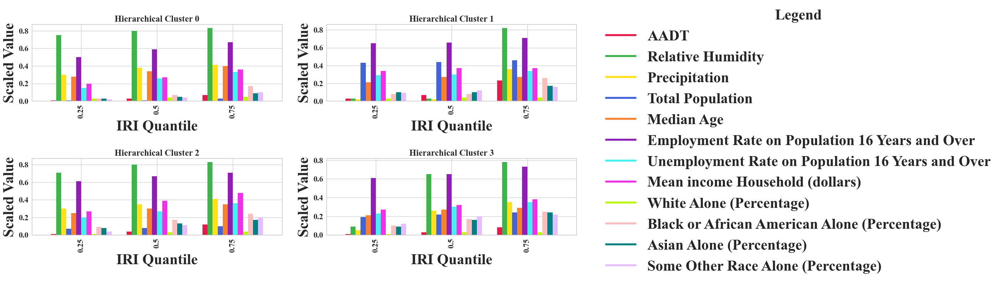

In [ ]:
# Setting font globally to Times New Roman, increasing default font size, and setting it to bold
plt.rcParams['font.size'] = 30  # Increasing the base font size
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Setup for the demonstration, specifically for hierarchical clustering
clusters_hierarchical = [0, 1, 2, 3]  # Adjusted for hierarchical clustering
quantiles_IRI_hierarchical = [0.25, 0.50, 0.75]

# Expanded color palette for greater variation
colors = [
    '#e6194b',  # Bright Red
    '#3cb44b',  # Bright Green
    '#ffe119',  # Bright Yellow
    '#4363d8',  # Bright Blue
    '#f58231',  # Bright Orange
    '#911eb4',  # Purple
    '#46f0f0',  # Cyan
    '#f032e6',  # Magenta
    '#bcf60c',  # Lime
    '#fabebe',  # Pink
    '#008080',  # Teal
    '#e6beff'   # Lavender
]

columns_to_plot_hierarchical = ['AADT', 'Relative Humidity',
       'Precipitation', 'Total Population', 'Median Age',
       'Employment Rate on Population 16 Years and Over',
       'Unemployment Rate on Population 16 Years and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage) ',
       'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)']

# Calculate the layout for subplots: up to 2 per row for the hierarchical clusters
n_rows_hierarchical = -(-len(clusters_hierarchical) // 2)  # Ceiling division to determine number of rows needed
fig, axes = plt.subplots(n_rows_hierarchical, 2, figsize=(20, 4 * n_rows_hierarchical))  # Increase figure size for larger visuals

# Flatten axes array for easy iteration if there are multiple rows
axes = axes.flatten()

for index, cluster in enumerate(clusters_hierarchical):
    # Using scaled_data_with_additional as the source DataFrame
    cluster_data_hierarchical = scaled_data_with_additional[scaled_data_with_additional['Hierarchical_cluster'] == cluster]
    cluster_data_hierarchical = cluster_data_hierarchical[columns_to_plot_hierarchical]
    cluster_quantiles_hierarchical = cluster_data_hierarchical.quantile(quantiles_IRI_hierarchical).round(2)

    # Plot each cluster's quantiles, specifically for hierarchical clustering
    cluster_quantiles_hierarchical.plot(kind='bar', color=colors[:len(columns_to_plot_hierarchical)], ax=axes[index], width=0.8, legend=False, fontsize=14)

    # Set titles, labels bold
    axes[index].set_title(f"Hierarchical Cluster {cluster}", fontsize=18, weight='bold')
    axes[index].set_xlabel('IRI Quantile', fontsize=30, weight='bold')
    axes[index].set_ylabel('Scaled Value', fontsize=30, weight='bold')
    for label in (axes[index].get_xticklabels() + axes[index].get_yticklabels()):
        label.set_fontsize(16)
        label.set_weight('bold')

# Hide unused axes if the number of clusters is not a multiple of 5
for ax in axes[index+1:]:
    ax.set_visible(False)

# Place the legend outside the plotting area to avoid overlap, specifically for hierarchical clustering
legend_elements = [plt.Line2D([0], [0], color=color, lw=4, label=col_name) for color, col_name in zip(colors, columns_to_plot_hierarchical)]
legend = fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.85, 0.5), title='Legend', fontsize=30, title_fontsize=30)
plt.setp(legend.get_title(), weight='bold')  # Set legend title bold

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to fit legend and prevent clipping, adjust rect to better accommodate the increased size
plt.savefig('hierarchical_clusters_all_variables_larger_bold_fonts.jpg')
plt.show()


## Check urbanality and rurarilty

C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\1561766219.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_data['quantile_category'] = cluster_data['IRI'].apply(lambda x: categorize_by_quantile(x, quantiles))
C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\1561766219.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_data['quantile_category'] = cluster_data['IRI'].apply(lambda x: categorize_by_quantile(x, quantiles))
C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\1561766219.

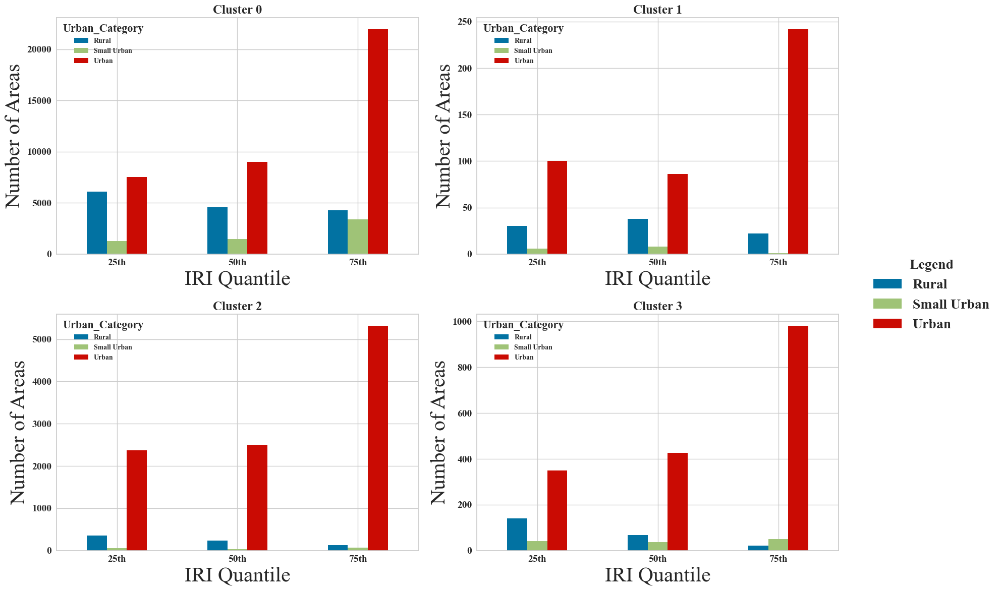

In [ ]:
# Setting font globally to Times New Roman, increasing default font size, and making it bold
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 16  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Assuming scaled_data_with_additional is your DataFrame
# Ensure it includes 'hierarchical_cluster', 'IRI_mean', and 'Urban_Code_mode_encoded'

# Mapping of numeric codes to labels
urban_code_labels = {
    0: 'Rural',
    1: 'Small Urban',
    2: 'Urban'
}

# Replace numeric codes with labels in the DataFrame
scaled_data_with_additional['Urban_Category'] = scaled_data_with_additional['Urban_Code_mode_encoded'].map(urban_code_labels)

# Determine the number of clusters for setting up the subplot grid
num_clusters = scaled_data_with_additional['Hierarchical_cluster'].nunique()
clusters_per_row = 2  # Define how many clusters you want per row in the subplot
rows_needed = -(-num_clusters // clusters_per_row)  # Ceiling division to determine rows needed

# Create a figure with subplots
fig, axs = plt.subplots(rows_needed, clusters_per_row, figsize=(20, rows_needed * 6))  # Adjust figsize as needed
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing between plots

# Flatten the axs array for easy iteration if there are multiple rows
if rows_needed * clusters_per_row > 1:
    axs = axs.flatten()

# Function to categorize by quantile
def categorize_by_quantile(value, quantiles):
    if value <= quantiles[0.25]:
        return '25th'
    elif value <= quantiles[0.5]:
        return '50th'
    else:
        return '75th'

# Loop through each cluster to plot
for index, cluster in enumerate(sorted(scaled_data_with_additional['Hierarchical_cluster'].unique())):
    cluster_data = scaled_data_with_additional[scaled_data_with_additional['Hierarchical_cluster'] == cluster]
    quantiles = cluster_data['IRI'].quantile([0.25, 0.5, 0.75])

    # Categorize each row by its quantile
    cluster_data['quantile_category'] = cluster_data['IRI'].apply(lambda x: categorize_by_quantile(x, quantiles))

    # Create a pivot table for plotting
    pivot_df = cluster_data.pivot_table(index='quantile_category', columns='Urban_Category', aggfunc='size', fill_value=0)

    # Plotting for the current cluster on its subplot
    pivot_df.plot(kind='bar', ax=axs[index], title=f'Hierarchical Cluster  {cluster}', legend=True, fontsize=14)
    axs[index].set_xlabel('IRI Quantile', fontsize=30)
    axs[index].set_ylabel('Number of Areas', fontsize=30)
    axs[index].tick_params(axis='x', rotation=0)
    axs[index].set_title(f'Cluster {cluster}', fontsize=18, weight='bold')

# Adjust or hide axes for any unused subplot slots if your number of clusters isn't a multiple of clusters_per_row
if rows_needed * clusters_per_row > 1:
    for ax in axs[num_clusters:]:
        ax.axis('off')

# Show the legend outside the last subplot to avoid overlap
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='right', bbox_to_anchor=(1, 0.5),  title='Legend', fontsize=20, title_fontsize=20)

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.savefig('hierarchical_urbanility_bold_fonts.jpg')
plt.show()


# Check avagerage values of the parameters in good, medium and bad pavements in cluster 1, 2 and 3

## Good pavements (mean_IRI =< 95)

In [ ]:
g_pavements = scaled_data_with_additional[scaled_data_with_additional['IRI'] <= 95]
g_pavements.describe()

,AADT,Year,IRI,Relative Humidity,Urban_Code_mode_encoded,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster,Hierarchical_cluster
count,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000,35613.000000
mean,0.084718,2018.759329,64.742942,0.740948,1.270997,0.344088,0.033221,0.344609,0.583271,0.255446,0.304811,0.045972,0.133332,0.076072,0.079999,5.206105,0.310252
std,0.091628,1.165852,16.627601,0.194600,0.918895,0.119638,0.053770,0.108358,0.140430,0.141871,0.140656,0.048062,0.141839,0.082120,0.095130,3.036328,0.760545
min,0.000000,2017.000000,30.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.025252,2018.000000,51.000000,0.760417,0.000000,0.318475,0.006049,0.278281,0.498812,0.143836,0.206133,0.033197,0.036601,0.029061,0.018957,2.000000,0.000000
50%,0.056555,2019.000000,64.000000,0.802951,2.000000,0.385173,0.015876,0.343891,0.593824,0.260274,0.281401,0.041229,0.087022,0.052566,0.046271,5.000000,0.000000
75%,0.107982,2020.000000,78.307692,0.828125,2.000000,0.414516,0.035923,0.404977,0.676960,0.328767,0.372498,0.046771,0.182426,0.100187,0.103916,8.000000,0.000000
max,1.000000,2020.000000,95.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.998109,1.000000,1.000000,9.000000,3.000000


In [ ]:
g_pavements.head(10)

,AADT,Year,IRI,Relative Humidity,Urban_Code_mode_encoded,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster,Hierarchical_cluster,Urban_Category
71903,0.106231,2020,30.0,0.147569,2,0.053421,0.012122,0.276018,0.522565,0.397260,0.261169,0.034371,0.030812,0.035421,0.708368,2,0,Urban
54426,0.083655,2020,30.0,0.338542,2,0.098593,0.045978,0.208145,0.736342,0.465753,0.400177,0.013360,0.124925,0.194491,0.196119,0,0,Urban
38993,0.163226,2019,30.0,0.819444,2,0.414408,0.035724,0.341629,0.672209,0.308219,0.310519,0.040931,0.084971,0.036966,0.159546,5,0,Urban
31564,0.119834,2019,30.0,0.032986,0,0.018223,0.440403,0.273756,0.655582,0.287671,0.372341,0.040257,0.079962,0.101531,0.082334,3,1,Rural
62751,0.095529,2020,30.0,0.804398,2,0.388720,0.115968,0.366516,0.665083,0.328767,0.382842,0.005069,0.167664,0.093720,0.032712,4,2,Urban
63237,0.103218,2020,30.0,0.826100,0,0.415757,0.012813,0.434389,0.617577,0.260274,0.407509,0.065034,0.014877,0.027194,0.020300,2,0,Rural
10053,0.040418,2017,30.0,0.835069,0,0.422077,0.004915,0.457014,0.448931,0.130137,0.146582,0.046454,0.083722,0.015534,0.009407,8,0,Rural
57227,0.010933,2020,30.0,0.938947,0,0.372701,0.003206,0.502262,0.546318,0.328767,0.204238,0.078164,0.015717,0.011318,0.011370,8,0,Rural
38982,0.109143,2019,30.0,0.796875,2,0.372784,0.010111,0.463801,0.584323,0.280822,0.244122,0.046094,0.082918,0.015689,0.002727,8,0,Urban
31845,0.044716,2019,30.0,0.052083,0,0.044181,0.017197,0.676471,0.292162,0.287671,0.210087,0.045419,0.010657,0.025616,0.088919,2,0,Rural


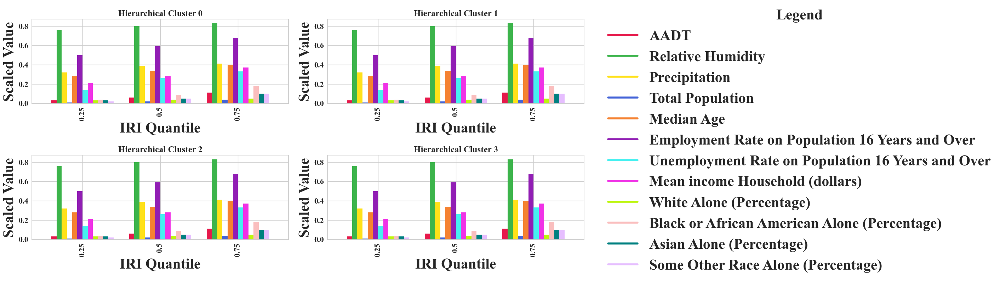

In [ ]:
# Setting font globally to Times New Roman, increasing default font size, and setting it to bold
plt.rcParams['font.size'] = 20  # Increasing the base font size
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Setup for the demonstration, specifically for hierarchical clustering
clusters_hierarchical = [0, 1, 2, 3]  # Adjusted for hierarchical clustering
quantiles_IRI_hierarchical = [0.25, 0.50, 0.75]

# Expanded color palette for greater variation
colors = [
    '#e6194b',  # Bright Red
    '#3cb44b',  # Bright Green
    '#ffe119',  # Bright Yellow
    '#4363d8',  # Bright Blue
    '#f58231',  # Bright Orange
    '#911eb4',  # Purple
    '#46f0f0',  # Cyan
    '#f032e6',  # Magenta
    '#bcf60c',  # Lime
    '#fabebe',  # Pink
    '#008080',  # Teal
    '#e6beff'   # Lavender
]

columns_to_plot_hierarchical = [
    'AADT', 'Relative Humidity',
    'Precipitation', 'Total Population', 'Median Age',
    'Employment Rate on Population 16 Years and Over',
    'Unemployment Rate on Population 16 Years and Over',
    'Mean income Household (dollars)', 'White Alone (Percentage)',
    'Black or African American Alone (Percentage) ',
    'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)'
]

# Calculate the layout for subplots: up to 2 per row for the hierarchical clusters
n_rows_hierarchical = -(-len(clusters_hierarchical) // 2)  # Ceiling division to determine number of rows needed
fig, axes = plt.subplots(n_rows_hierarchical, 2, figsize=(20, 4 * n_rows_hierarchical))  # Increase figure size for larger visuals

# Flatten axes array for easy iteration if there are multiple rows
axes = axes.flatten()

for index, cluster in enumerate(clusters_hierarchical):
    # Using scaled_data_with_additional as the source DataFrame
    cluster_data_hierarchical = g_pavements[g_pavements['Hierarchical_cluster'] == cluster]
    cluster_data_hierarchical = g_pavements[columns_to_plot_hierarchical]
    cluster_quantiles_hierarchical = cluster_data_hierarchical.quantile(quantiles_IRI_hierarchical).round(2)

    # Plot each cluster's quantiles, specifically for hierarchical clustering
    cluster_quantiles_hierarchical.plot(kind='bar', color=colors[:len(columns_to_plot_hierarchical)], ax=axes[index], width=0.8, legend=False, fontsize=14)

    # Set titles, labels bold
    axes[index].set_title(f"Hierarchical Cluster {cluster}", fontsize=18, weight='bold')
    axes[index].set_xlabel('IRI Quantile', fontsize=30, weight='bold')
    axes[index].set_ylabel('Scaled Value', fontsize=30, weight='bold')
    for label in (axes[index].get_xticklabels() + axes[index].get_yticklabels()):
        label.set_fontsize(16)
        label.set_weight('bold')

# Hide unused axes if the number of clusters is not a multiple of 5
for ax in axes[index+1:]:
    ax.set_visible(False)

# Place the legend outside the plotting area to avoid overlap, specifically for hierarchical clustering
legend_elements = [plt.Line2D([0], [0], color=color, lw=4, label=col_name) for color, col_name in zip(colors, columns_to_plot_hierarchical)]
legend = fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.85, 0.5),  title='Legend', fontsize=30, title_fontsize=30)
plt.setp(legend.get_title(), weight='bold')  # Set legend title bold

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to fit legend and prevent clipping, adjust rect to better accommodate the increased size
plt.savefig('hierarchical_clusters_all_variables_larger_bold_fonts.jpg')
plt.show()


## Check urbanality and rurarilty

C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\350737115.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  g_pavements['Urban_Category'] = g_pavements['Urban_Code_mode_encoded'].map(urban_code_labels)
C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\350737115.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_data['quantile_category'] = cluster_data['IRI'].apply(lambda x: categorize_by_quantile(x, quantiles))
C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\350737115.py:47: SettingWithC

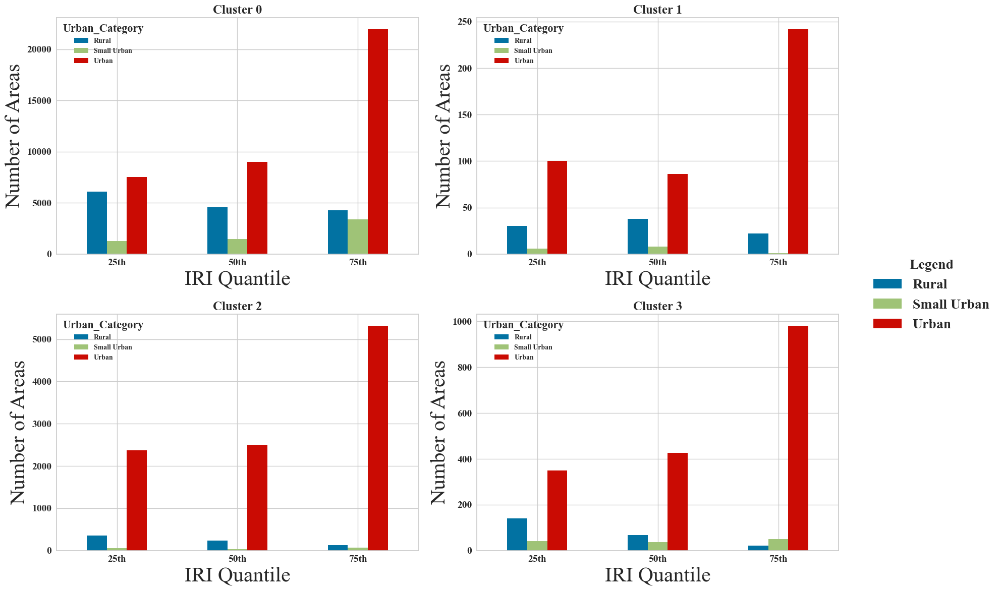

In [ ]:

# Setting font globally to Times New Roman, increasing default font size, and making it bold
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 16  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Assuming scaled_data_with_additional is your DataFrame
# Ensure it includes 'hierarchical_cluster', 'IRI_mean', and 'Urban_Code_mode_encoded'

# Mapping of numeric codes to labels
urban_code_labels = {
    0: 'Rural',
    1: 'Small Urban',
    2: 'Urban'
}

# Replace numeric codes with labels in the DataFrame
g_pavements['Urban_Category'] = g_pavements['Urban_Code_mode_encoded'].map(urban_code_labels)

# Determine the number of clusters for setting up the subplot grid
num_clusters = g_pavements['Hierarchical_cluster'].nunique()
clusters_per_row = 2  # Define how many clusters you want per row in the subplot
rows_needed = -(-num_clusters // clusters_per_row)  # Ceiling division to determine rows needed

# Create a figure with subplots
fig, axs = plt.subplots(rows_needed, clusters_per_row, figsize=(20, rows_needed * 6))  # Adjust figsize as needed
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing between plots

# Flatten the axs array for easy iteration if there are multiple rows
if rows_needed * clusters_per_row > 1:
    axs = axs.flatten()

# Function to categorize by quantile
def categorize_by_quantile(value, quantiles):
    if value <= quantiles[0.25]:
        return '25th'
    elif value <= quantiles[0.5]:
        return '50th'
    else:
        return '75th'

# Loop through each cluster to plot
for index, cluster in enumerate(sorted(scaled_data_with_additional['Hierarchical_cluster'].unique())):
    cluster_data = scaled_data_with_additional[scaled_data_with_additional['Hierarchical_cluster'] == cluster]
    quantiles = cluster_data['IRI'].quantile([0.25, 0.5, 0.75])

    # Categorize each row by its quantile
    cluster_data['quantile_category'] = cluster_data['IRI'].apply(lambda x: categorize_by_quantile(x, quantiles))

    # Create a pivot table for plotting
    pivot_df = cluster_data.pivot_table(index='quantile_category', columns='Urban_Category', aggfunc='size', fill_value=0)

    # Plotting for the current cluster on its subplot
    pivot_df.plot(kind='bar', ax=axs[index], title=f'Hierarchical Cluster {cluster}', legend=True, fontsize=14)
    axs[index].set_xlabel('IRI Quantile', fontsize=30)
    axs[index].set_ylabel('Number of Areas', fontsize=30)
    axs[index].tick_params(axis='x', rotation=0)
    axs[index].set_title(f'Cluster {cluster}', fontsize=18, weight='bold')

# Adjust or hide axes for any unused subplot slots if your number of clusters isn't a multiple of clusters_per_row
if rows_needed * clusters_per_row > 1:
    for ax in axs[num_clusters:]:
        ax.axis('off')

# Show the legend outside the last subplot to avoid overlap
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='right', bbox_to_anchor=(1, 0.5),  title='Legend', fontsize=20, title_fontsize=20)

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.savefig('hierarchical_urbanility_bold_fonts.jpg')
plt.show()


## Acceptable pavements (95 <= mean_IRI =< 170)

In [ ]:
m_pavements = scaled_data_with_additional[(scaled_data_with_additional['IRI'] > 95) & (scaled_data_with_additional['IRI'] <= 170)]
m_pavements.describe()

,AADT,Year,IRI,Relative Humidity,Urban_Code_mode_encoded,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster,Hierarchical_cluster
count,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000,23600.000000
mean,0.045714,2018.708898,127.070389,0.725099,1.595212,0.333352,0.037527,0.323100,0.600316,0.260745,0.310906,0.043577,0.133793,0.093218,0.092374,5.070508,0.406483
std,0.067568,1.135883,21.207872,0.195409,0.743292,0.128779,0.056128,0.101258,0.129900,0.142799,0.140549,0.046559,0.142966,0.131043,0.113089,3.105233,0.856440
min,0.000005,2017.000000,95.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.009274,2018.000000,108.750000,0.729167,2.000000,0.285340,0.007873,0.262443,0.522565,0.157534,0.211918,0.031185,0.034465,0.031638,0.020599,2.000000,0.000000
50%,0.024725,2019.000000,124.250000,0.795139,2.000000,0.367441,0.019544,0.321267,0.617577,0.260274,0.286946,0.040052,0.086445,0.055441,0.049404,5.000000,0.000000
75%,0.054687,2020.000000,144.000000,0.826389,2.000000,0.414395,0.045350,0.380090,0.688836,0.342466,0.385069,0.045654,0.183413,0.108041,0.124587,8.000000,0.000000
max,0.842707,2020.000000,170.000000,1.000000,2.000000,1.000000,1.000000,0.997738,1.000000,1.000000,0.881620,1.000000,1.000000,1.000000,1.000000,9.000000,3.000000


In [ ]:
pd.to_numeric(m_pavements['IRI'], errors='coerce')
m_pavements.round(0).head(5)

,AADT,Year,IRI,Relative Humidity,Urban_Code_mode_encoded,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster,Hierarchical_cluster,Urban_Category
5561,0.0,2017,95.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,8,0,Rural
38282,0.0,2019,95.0,1.0,2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,8,0,Urban
13304,0.0,2017,95.0,1.0,2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2,0,Urban
52121,0.0,2020,95.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1,3,Rural
47235,0.0,2019,95.0,1.0,2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9,2,Urban


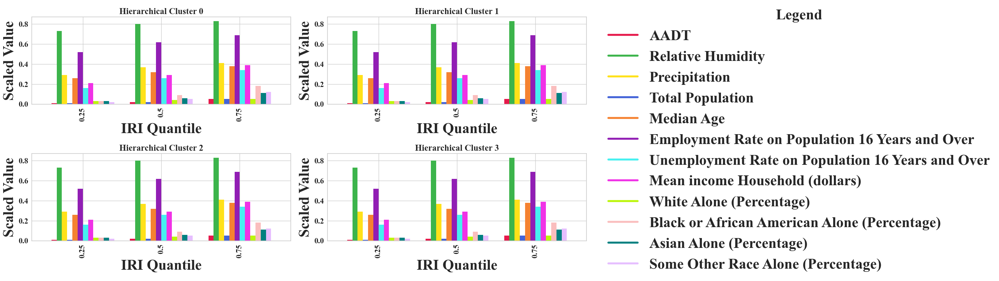

In [ ]:
# Setting font globally to Times New Roman, increasing default font size, and setting it to bold
plt.rcParams['font.size'] = 16  # Increasing the base font size
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Setup for the demonstration, specifically for hierarchical clustering
clusters_hierarchical = [0, 1, 2, 3]  # Adjusted for hierarchical clustering
quantiles_IRI_hierarchical = [0.25, 0.50, 0.75]

# Expanded color palette for greater variation
colors = [
    '#e6194b',  # Bright Red
    '#3cb44b',  # Bright Green
    '#ffe119',  # Bright Yellow
    '#4363d8',  # Bright Blue
    '#f58231',  # Bright Orange
    '#911eb4',  # Purple
    '#46f0f0',  # Cyan
    '#f032e6',  # Magenta
    '#bcf60c',  # Lime
    '#fabebe',  # Pink
    '#008080',  # Teal
    '#e6beff'   # Lavender
]

columns_to_plot_hierarchical = [
    'AADT', 'Relative Humidity',
    'Precipitation', 'Total Population', 'Median Age',
    'Employment Rate on Population 16 Years and Over',
    'Unemployment Rate on Population 16 Years and Over',
    'Mean income Household (dollars)', 'White Alone (Percentage)',
    'Black or African American Alone (Percentage) ',
    'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)'
]

# Calculate the layout for subplots: up to 2 per row for the hierarchical clusters
n_rows_hierarchical = -(-len(clusters_hierarchical) // 2)  # Ceiling division to determine number of rows needed
fig, axes = plt.subplots(n_rows_hierarchical, 2, figsize=(20, 4 * n_rows_hierarchical))  # Increase figure size for larger visuals

# Flatten axes array for easy iteration if there are multiple rows
axes = axes.flatten()

for index, cluster in enumerate(clusters_hierarchical):
    # Using scaled_data_with_additional as the source DataFrame
    cluster_data_hierarchical = m_pavements[m_pavements['Hierarchical_cluster'] == cluster]
    cluster_data_hierarchical = m_pavements[columns_to_plot_hierarchical]
    cluster_quantiles_hierarchical = cluster_data_hierarchical.quantile(quantiles_IRI_hierarchical).round(2)

    # Plot each cluster's quantiles, specifically for hierarchical clustering
    cluster_quantiles_hierarchical.plot(kind='bar', color=colors[:len(columns_to_plot_hierarchical)], ax=axes[index], width=0.8, legend=False, fontsize=14)

    # Set titles, labels bold
    axes[index].set_title(f"Hierarchical Cluster {cluster}", fontsize=18, weight='bold')
    axes[index].set_xlabel('IRI Quantile', fontsize=30, weight='bold')
    axes[index].set_ylabel('Scaled Value', fontsize=30, weight='bold')
    for label in (axes[index].get_xticklabels() + axes[index].get_yticklabels()):
        label.set_fontsize(16)
        label.set_weight('bold')

# Hide unused axes if the number of clusters is not a multiple of 5
for ax in axes[index+1:]:
    ax.set_visible(False)

# Place the legend outside the plotting area to avoid overlap, specifically for hierarchical clustering
legend_elements = [plt.Line2D([0], [0], color=color, lw=4, label=col_name) for color, col_name in zip(colors, columns_to_plot_hierarchical)]
legend = fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.85, 0.5),  title='Legend', fontsize=30, title_fontsize=30)
plt.setp(legend.get_title(), weight='bold')  # Set legend title bold

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to fit legend and prevent clipping, adjust rect to better accommodate the increased size
plt.savefig('hierarchical_clusters_all_variables_larger_bold_fonts.jpg')
plt.show()


## Check urban and rural

C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\3079606615.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m_pavements['Urban_Category'] = m_pavements['Urban_Code_mode_encoded'].map(urban_code_labels)
C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\3079606615.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_data['quantile_category'] = cluster_data['IRI'].apply(lambda x: categorize_by_quantile(x, quantiles))
C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\3079606615.py:47: SettingWi

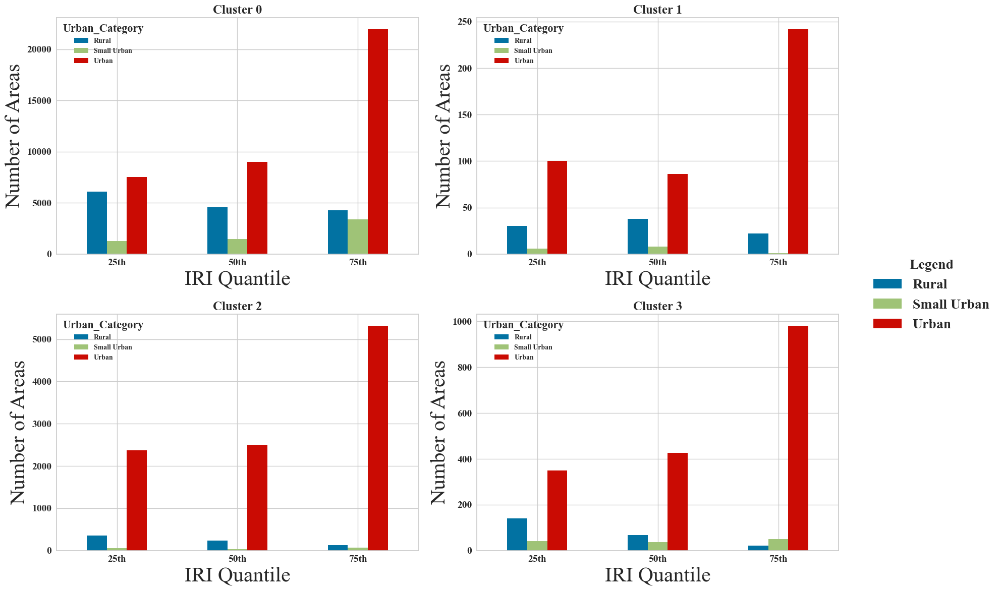

In [ ]:

# Setting font globally to Times New Roman, increasing default font size, and making it bold
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 16  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Assuming scaled_data_with_additional is your DataFrame
# Ensure it includes 'hierarchical_cluster', 'IRI_mean', and 'Urban_Code_mode_encoded'

# Mapping of numeric codes to labels
urban_code_labels = {
    0: 'Rural',
    1: 'Small Urban',
    2: 'Urban'
}

# Replace numeric codes with labels in the DataFrame
m_pavements['Urban_Category'] = m_pavements['Urban_Code_mode_encoded'].map(urban_code_labels)

# Determine the number of clusters for setting up the subplot grid
num_clusters = m_pavements['Hierarchical_cluster'].nunique()
clusters_per_row = 2  # Define how many clusters you want per row in the subplot
rows_needed = -(-num_clusters // clusters_per_row)  # Ceiling division to determine rows needed

# Create a figure with subplots
fig, axs = plt.subplots(rows_needed, clusters_per_row, figsize=(20, rows_needed * 6))  # Adjust figsize as needed
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing between plots

# Flatten the axs array for easy iteration if there are multiple rows
if rows_needed * clusters_per_row > 1:
    axs = axs.flatten()

# Function to categorize by quantile
def categorize_by_quantile(value, quantiles):
    if value <= quantiles[0.25]:
        return '25th'
    elif value <= quantiles[0.5]:
        return '50th'
    else:
        return '75th'

# Loop through each cluster to plot
for index, cluster in enumerate(sorted(scaled_data_with_additional['Hierarchical_cluster'].unique())):
    cluster_data = scaled_data_with_additional[scaled_data_with_additional['Hierarchical_cluster'] == cluster]
    quantiles = cluster_data['IRI'].quantile([0.25, 0.5, 0.75])

    # Categorize each row by its quantile
    cluster_data['quantile_category'] = cluster_data['IRI'].apply(lambda x: categorize_by_quantile(x, quantiles))

    # Create a pivot table for plotting
    pivot_df = cluster_data.pivot_table(index='quantile_category', columns='Urban_Category', aggfunc='size', fill_value=0)

    # Plotting for the current cluster on its subplot
    pivot_df.plot(kind='bar', ax=axs[index], title=f'Hierarchical Cluster {cluster}', legend=True, fontsize=14)
    axs[index].set_xlabel('IRI Quantile', fontsize=30)
    axs[index].set_ylabel('Number of Areas', fontsize=30)
    axs[index].tick_params(axis='x', rotation=0)
    axs[index].set_title(f'Cluster {cluster}', fontsize=18, weight='bold')

# Adjust or hide axes for any unused subplot slots if your number of clusters isn't a multiple of clusters_per_row
if rows_needed * clusters_per_row > 1:
    for ax in axs[num_clusters:]:
        ax.axis('off')

# Show the legend outside the last subplot to avoid overlap
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='right', bbox_to_anchor=(1, 0.5),  title='Legend', fontsize=20, title_fontsize=20)

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.savefig('hierarchical_urbanility_bold_fonts.jpg')
plt.show()


## Poor pavements (mean_IRI > 170)

In [ ]:
p_pavements = scaled_data_with_additional[scaled_data_with_additional['IRI'] > 170]
p_pavements.describe()

,AADT,Year,IRI,Relative Humidity,Urban_Code_mode_encoded,Precipitation,Total Population,Median Age,Employment Rate on Population 16 Years and Over,Unemployment Rate on Population 16 Years and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),Asian Alone (Percentage),Some Other Race Alone (Percentage),kmeans_data_cluster,Hierarchical_cluster
count,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000,14067.000000
mean,0.023806,2018.708538,235.135174,0.717004,1.794768,0.326239,0.047415,0.297441,0.612481,0.278607,0.323805,0.041488,0.152554,0.129815,0.098570,5.048482,0.595792
std,0.036518,1.052612,58.372502,0.182330,0.526727,0.129318,0.065485,0.090346,0.118231,0.138978,0.149289,0.059937,0.166697,0.199483,0.118212,3.176219,0.984223
min,0.000021,2017.000000,170.100000,0.000000,0.000000,0.000000,0.000022,0.002262,0.049881,0.000000,0.028864,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.004182,2018.000000,191.000000,0.670139,2.000000,0.274950,0.010438,0.233032,0.543943,0.191781,0.216790,0.025722,0.034465,0.035616,0.022298,2.000000,0.000000
50%,0.012193,2019.000000,218.500000,0.775463,2.000000,0.341260,0.023717,0.298643,0.617577,0.273973,0.293934,0.037303,0.101506,0.068922,0.050980,5.000000,0.000000
75%,0.030731,2020.000000,264.000000,0.823206,2.000000,0.406968,0.064238,0.352941,0.691211,0.356164,0.406676,0.044176,0.202069,0.129165,0.132974,8.000000,2.000000
max,0.760358,2020.000000,615.000000,1.000000,2.000000,1.000000,1.000000,0.800905,1.000000,1.000000,0.881620,1.000000,0.998109,1.000000,1.000000,9.000000,3.000000


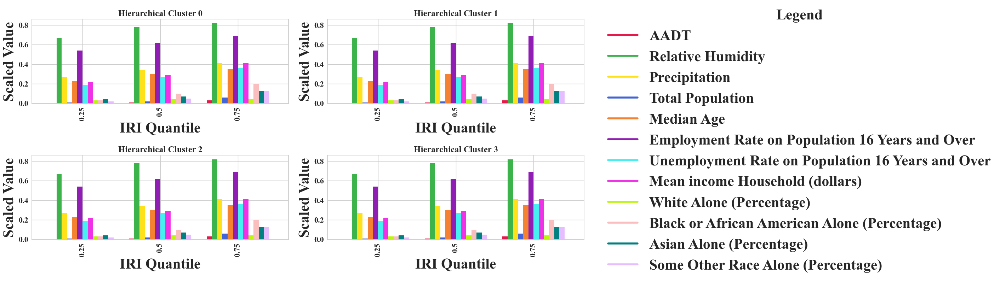

In [ ]:
# Setting font globally to Times New Roman, increasing default font size, and setting it to bold
plt.rcParams['font.size'] = 20  # Increasing the base font size
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Setup for the demonstration, specifically for hierarchical clustering
clusters_hierarchical = [0, 1, 2, 3]  # Adjusted for hierarchical clustering
quantiles_IRI_hierarchical = [0.25, 0.50, 0.75]

# Expanded color palette for greater variation
colors = [
    '#e6194b',  # Bright Red
    '#3cb44b',  # Bright Green
    '#ffe119',  # Bright Yellow
    '#4363d8',  # Bright Blue
    '#f58231',  # Bright Orange
    '#911eb4',  # Purple
    '#46f0f0',  # Cyan
    '#f032e6',  # Magenta
    '#bcf60c',  # Lime
    '#fabebe',  # Pink
    '#008080',  # Teal
    '#e6beff'   # Lavender
]

columns_to_plot_hierarchical = [
    'AADT', 'Relative Humidity',
    'Precipitation', 'Total Population', 'Median Age',
    'Employment Rate on Population 16 Years and Over',
    'Unemployment Rate on Population 16 Years and Over',
    'Mean income Household (dollars)', 'White Alone (Percentage)',
    'Black or African American Alone (Percentage) ',
    'Asian Alone (Percentage)', 'Some Other Race Alone (Percentage)'
]

# Calculate the layout for subplots: up to 2 per row for the hierarchical clusters
n_rows_hierarchical = -(-len(clusters_hierarchical) // 2)  # Ceiling division to determine number of rows needed
fig, axes = plt.subplots(n_rows_hierarchical, 2, figsize=(20, 4 * n_rows_hierarchical))  # Increase figure size for larger visuals

# Flatten axes array for easy iteration if there are multiple rows
axes = axes.flatten()

for index, cluster in enumerate(clusters_hierarchical):
    # Using scaled_data_with_additional as the source DataFrame
    cluster_data_hierarchical = p_pavements[p_pavements['Hierarchical_cluster'] == cluster]
    cluster_data_hierarchical = p_pavements[columns_to_plot_hierarchical]
    cluster_quantiles_hierarchical = cluster_data_hierarchical.quantile(quantiles_IRI_hierarchical).round(2)

    # Plot each cluster's quantiles, specifically for hierarchical clustering
    cluster_quantiles_hierarchical.plot(kind='bar', color=colors[:len(columns_to_plot_hierarchical)], ax=axes[index], width=0.8, legend=False, fontsize=14)

    # Set titles, labels bold
    axes[index].set_title(f"Hierarchical Cluster {cluster}", fontsize=18, weight='bold')
    axes[index].set_xlabel('IRI Quantile', fontsize=30, weight='bold')
    axes[index].set_ylabel('Scaled Value', fontsize=30, weight='bold')
    for label in (axes[index].get_xticklabels() + axes[index].get_yticklabels()):
        label.set_fontsize(16)
        label.set_weight('bold')

# Hide unused axes if the number of clusters is not a multiple of 5
for ax in axes[index+1:]:
    ax.set_visible(False)

# Place the legend outside the plotting area to avoid overlap, specifically for hierarchical clustering
legend_elements = [plt.Line2D([0], [0], color=color, lw=4, label=col_name) for color, col_name in zip(colors, columns_to_plot_hierarchical)]
legend = fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.85, 0.5),  title='Legend', fontsize=30, title_fontsize=30)
plt.setp(legend.get_title(), weight='bold')  # Set legend title bold

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to fit legend and prevent clipping, adjust rect to better accommodate the increased size
plt.savefig('hierarchical_clusters_all_variables_larger_bold_fonts.jpg')
plt.show()


## Check urban and rural

C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\730581441.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p_pavements['Urban_Category'] = p_pavements['Urban_Code_mode_encoded'].map(urban_code_labels)
C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\730581441.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_data['quantile_category'] = cluster_data['IRI'].apply(lambda x: categorize_by_quantile(x, quantiles))
C:\Users\tadnan\AppData\Local\Temp\ipykernel_19268\730581441.py:47: SettingWithC

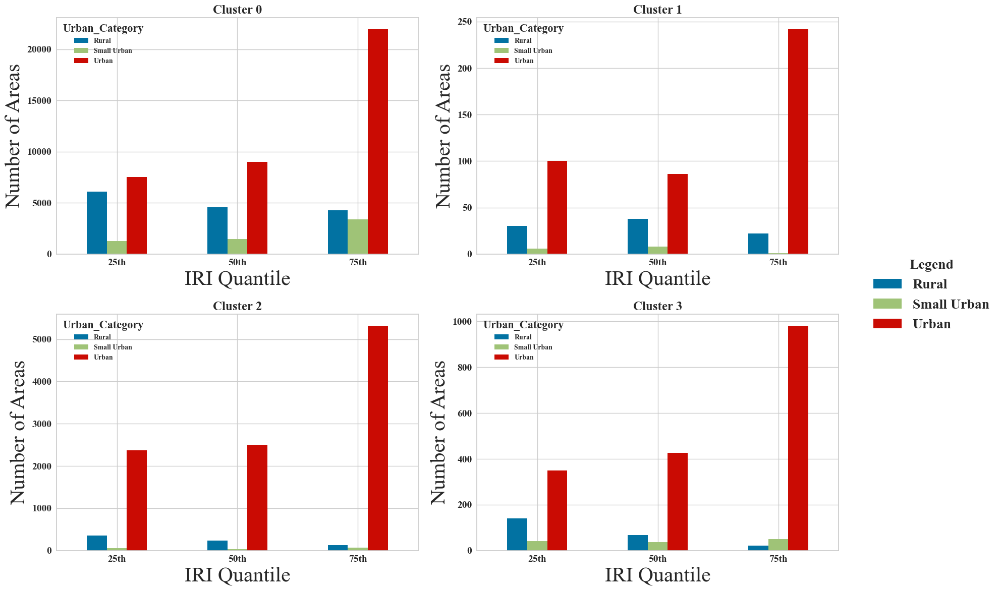

In [ ]:

# Setting font globally to Times New Roman, increasing default font size, and making it bold
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 16  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Assuming scaled_data_with_additional is your DataFrame
# Ensure it includes 'hierarchical_cluster', 'IRI_mean', and 'Urban_Code_mode_encoded'

# Mapping of numeric codes to labels
urban_code_labels = {
    0: 'Rural',
    1: 'Small Urban',
    2: 'Urban'
}

# Replace numeric codes with labels in the DataFrame
p_pavements['Urban_Category'] = p_pavements['Urban_Code_mode_encoded'].map(urban_code_labels)

# Determine the number of clusters for setting up the subplot grid
num_clusters = p_pavements['Hierarchical_cluster'].nunique()
clusters_per_row = 2  # Define how many clusters you want per row in the subplot
rows_needed = -(-num_clusters // clusters_per_row)  # Ceiling division to determine rows needed

# Create a figure with subplots
fig, axs = plt.subplots(rows_needed, clusters_per_row, figsize=(20, rows_needed * 6))  # Adjust figsize as needed
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing between plots

# Flatten the axs array for easy iteration if there are multiple rows
if rows_needed * clusters_per_row > 1:
    axs = axs.flatten()

# Function to categorize by quantile
def categorize_by_quantile(value, quantiles):
    if value <= quantiles[0.25]:
        return '25th'
    elif value <= quantiles[0.5]:
        return '50th'
    else:
        return '75th'

# Loop through each cluster to plot
for index, cluster in enumerate(sorted(scaled_data_with_additional['Hierarchical_cluster'].unique())):
    cluster_data = scaled_data_with_additional[scaled_data_with_additional['Hierarchical_cluster'] == cluster]
    quantiles = cluster_data['IRI'].quantile([0.25, 0.5, 0.75])

    # Categorize each row by its quantile
    cluster_data['quantile_category'] = cluster_data['IRI'].apply(lambda x: categorize_by_quantile(x, quantiles))

    # Create a pivot table for plotting
    pivot_df = cluster_data.pivot_table(index='quantile_category', columns='Urban_Category', aggfunc='size', fill_value=0)

    # Plotting for the current cluster on its subplot
    pivot_df.plot(kind='bar', ax=axs[index], title=f'Hierarchical Cluster {cluster}', legend=True, fontsize=14)
    axs[index].set_xlabel('IRI Quantile', fontsize=30)
    axs[index].set_ylabel('Number of Areas', fontsize=30)
    axs[index].tick_params(axis='x', rotation=0)
    axs[index].set_title(f'Cluster {cluster}', fontsize=18, weight='bold')

# Adjust or hide axes for any unused subplot slots if your number of clusters isn't a multiple of clusters_per_row
if rows_needed * clusters_per_row > 1:
    for ax in axs[num_clusters:]:
        ax.axis('off')

# Show the legend outside the last subplot to avoid overlap
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='right', bbox_to_anchor=(1, 0.5),  title='Legend', fontsize=20, title_fontsize=20)

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.savefig('hierarchical_urbanility_bold_fonts.jpg')
plt.show()
